As of 27.09.22:

**Main To-Do/Sanity check**:
- just the icecores from greenland: They should show warming both in the observational data and the d18O.


# Calculation of linear regression parameters for the statistical PSM

* the DA wrapper now also permits the use of statistical PSMs. To make use of them we need to precalculate regression slopes and intercepts for each proxy site with respect to instrumental data, these parameters are then applied to the simulation data. Hence, the dataset for calibration and the one it is finally applied too are completely indepent.
* I don't think it's useful to calibrate the proxies in the DA wrapper
* For the icecores one could also just use some uniform formula (see below).

## Purpose of this notebook:

* Read in instrumental surface temperature data
* Read in proxy data and bring into right form (here iso2k delta 18O)
* Provide reusable functions for regression and visualizing the results
* Function for adding regression slope, intercept and error to the proxy-table
* Compare the regression results for two "instrumental" datasets, Berkeley Earth and 20CR (which is also data assimilated)


Method used in publications:
* I think they always work on anomalies, not absolute values (in the end this shouldn't change anything as long one uses the right variable in the DA-wrapper)
* in Phyda also precipitation data from GCPC is used, proxies normalized to unit variance (however this relates mostly to treerings and corals)
* LMR version II (Tardif 2019) adds the option of capturing the specific seasonality for proxies (especially for the tree rings). This should not be difficult to add here and in the DA-PSM functions (we just need to calculate a specific seasonal mean for each proxy location from the simulation data)
* Most publications don't really mention, that for icecores there are only very few data points in the instrumental datasets

Instrumental data used in publications:
* Steiger 2017 (icecores): Berkeley Earth
* PHYDA: Berkeley Earth + Hadcrut
    
Alternative Dataset:
* 20th century reanalysis (https://psl.noaa.gov/data/20thC_Rean/) provides temperatures also for the poles (obtained via Data Assimilation from surface pressure fields)
  
Problems:
* For icecore we need temperatures at antarctic locations, but there are only records after 1956 there (see the corresponding figures below). This restricts us to use proxies, which also have values in the second half of the 20th century.
* Some locations have


## Codes/methodlogy details from other people
* PHYDA:  calibration period 1920 - 2000, at least 20 values in this period, 1871-1919  for verification (this is not applicable to icecores) https://github.com/njsteiger/PHYDA-v1/blob/master/psm_ul.m
* Steiger 2017: no standardization, just removed time mean. data: both berkely earth and HadCRUT. 38 icecore proxies. calibration period 1880 -2014. The publication is just a instrumental era reconstruction anyway.
* Tardif LMR Update (2019): model prior is 850 - 1850 CE -> so they compute anomalies with respect to that perior (not the same as for the instrumental data!). regression on basis of deviations from the mean over refrence period 1951-1980. at least 25 data poins. GISTEMP and Berkely Earth. Proxies Anderson 2019 (also includes icecore d18O) <- need to have a look if this is the iso2k db.
* Zhu 2020: Lmr turbo (are the icecores relevant there?) https://github.com/fzhu2e/LMRt/blob/master/LMRt/proxy.py
* Badgeley 2020: d18O-temperature formula

## d18O - temperature relationships:
    - Johnson 1989: 0.67 +- 0.02 (https://onlinelibrary.wiley.com/doi/epdf/10.1111/j.1600-0889.1989.tb00321.x)
    - Dansgaard 0.62T
    
## Idea for keeping more proxies:

Create a Map with mean regression value for each gridbox and I select the closest regression value for each proxy, even the ones where there is no recend data??


## Zhu - Re-appraisal of the ENSO response
Corals: SST regression. No icecores!

https://github.com/fzhu2e/LMRt/blob/master/LMRt/psm.py
https://github.com/fzhu2e/LMRt/blob/master/LMRt/reconjob.py
https://github.com/fzhu2e/LMRt/blob/master/LMRt/proxy.py
All of this is too complicated!

(Class based stuff, doing everything including calibration in the da wrapper)


In [1]:
import numpy as np
import xarray as xr
import cftime
import matplotlib.pyplot as plt
import os
from scipy.stats import linregress

import cartopy.crs as ccrs
#from cartopy.util import add_cyclic_point
import cartopy.mpl.ticker as cticker

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import sys
sys.path.append('/home/mchoblet/paleoda')

import psm_pseudoproxy
import dataloader

import proxy_loader
import cartopy.crs as ccrs
import cartopy.feature as cfeature  

In [2]:
import pickle
import seaborn as sns
import matplotlib as mpl

In [3]:

%load_ext autoreload
%autoreload 2

In [4]:
#Helpers
# nan counter
def nan_counter(data):
    """
    Count nan values, plot max, min and mean
    """
    x=data.copy()
    nans=np.count_nonzero(np.isnan(x))
    total=len(x.values.flatten())
    print(x.name,', nans:',nans, 'percentage:',nans/total*100,' %')
    
# nan map
def nan_map(data):
    #data should be in dataarray or numpy array form
    #the first axis needs to be time!
    nan_map=data.copy().isel(time=0)
    print('NAN count for the monthly values')
    nan_map.data=np.count_nonzero(np.isnan(data),axis=0)
    nan_map.plot()

# global mean plot/Global std plot
def mapplot(xarray,title=None):
    """
    xarray is a DataArray or a numpy array
    """
    vmax=np.nanpercentile(xarray,99)
    vmin=np.nanpercentile(xarray,1)
    fig = plt.figure(figsize=(18,10))
    cbar_kwargs = {'orientation':'horizontal', 'shrink':0.6, 'aspect':40}
    xarray.plot(transform=ccrs.PlateCarree(),
                                     subplot_kws={'projection': ccrs.Robinson()},
               robust=True,
                cbar_kwargs=cbar_kwargs,
                vmax=vmax,vmin=vmin
               ) # <--- Change Projection here
   
    fig.axes[0].coastlines()
    #fig.axes[0].gridlines()
    if title is not None:
        fig.axes[0].set_title(str(title), size=20, family='monospace', variant='small-caps')

## Load Berkely Earth Dataset



In [5]:
#BE_path='/home/mchoblet/raw_data/calibration/Land_and_Ocean_LatLong1.nc'
#land only
BE_path='/home/mchoblet/raw_data/calibration/Complete_TAVG_LatLong1.nc'
BE=xr.open_dataset(BE_path)['temperature']
#CONVERT BE LONGITUDES TO 0-360
BE['longitude']=BE['longitude'] % 360
BE= BE.sortby(BE.longitude)
BE=BE.rename({'latitude':'lat'})
BE=BE.rename({'longitude':'lon'})

#echange time of dataset (else calendar-problem when slicing)
new_time=xr.cftime_range(start='1750',periods=3272,freq='MS',calendar='365_day')
BE['time']=new_time

NAN count for the monthly values


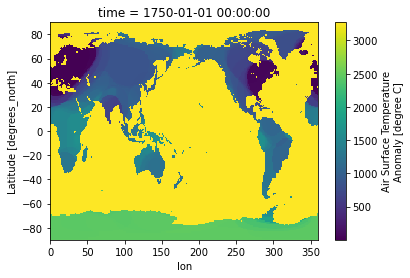

In [6]:
nan_map(BE)
#as this is a land only dataset, obviously the sea has only nans

In [466]:
def first_non_nan(data):
    #collect the year of the first non nan value
    empty=np.empty((len(data.lat),len(data.lon)))
    for i,lat in enumerate(data.lat):
        for j,lon in enumerate(data.lon):
            try:
                empty[i,j]=data.sel(lat=lat,lon=lon).dropna('time')[0].time.dt.year
            except:
                empty[i,j]=2000
    return empty

In [467]:
non_nan=first_non_nan(BE)

(array([ 3907.,  1763.,  5155.,  3513.,  2204.,   949.,   143.,  1071.,
         5606., 40489.]),
 array([1750., 1775., 1800., 1825., 1850., 1875., 1900., 1925., 1950.,
        1975., 2000.]),
 <BarContainer object of 10 artists>)

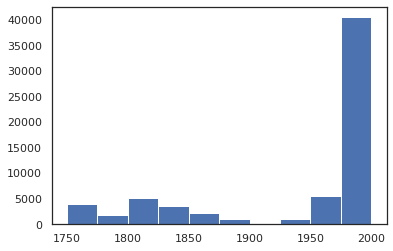

In [477]:
plt.hist(non_nan.reshape(-1))

NAN count for the monthly values


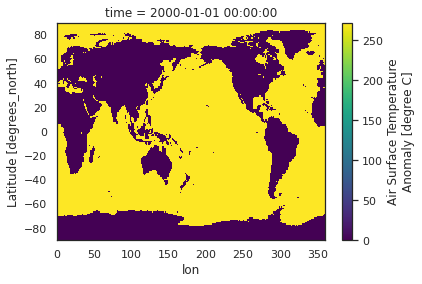

In [504]:
nan_map(BE[300:])

In [7]:
BE_mean=dataloader.annual_mean(BE,avg=None,check_nan=False)
zeros=np.count_nonzero(BE_mean==0)
total=len(BE_mean.values.reshape(-1))

1955-01-01 00:00:00


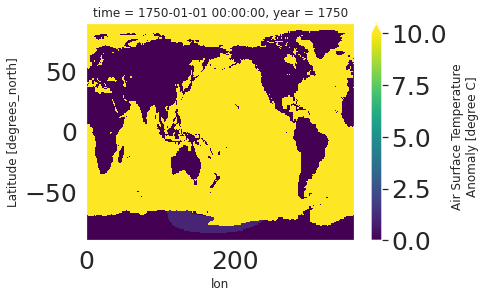

In [107]:
#plot the zeros
i=205
#nonexisting data are zeros
print(BE_mean.time[i].values)
data_new=BE_mean[i:]
zero_map=BE_mean.isel(time=0)

zero_map.data=np.count_nonzero(data_new==0,axis=0)
zero_map.plot(vmax=10)

1956-01-01 00:00:00


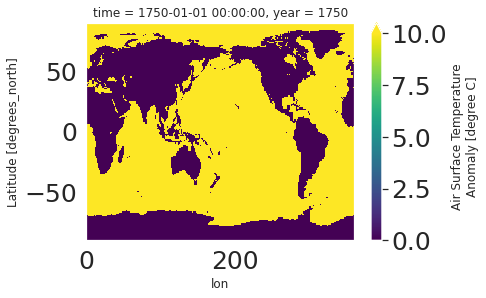

In [108]:
#plot the zeros
i=206
#nonexisting data are zeros
print(BE_mean.time[i].values)
data_new=BE_mean[i:]
zero_map=BE_mean.isel(time=0)

zero_map.data=np.count_nonzero(data_new==0,axis=0)
zero_map.plot(vmax=10)

**After year 1956 there are no zeros left in the annual reconstruction, from that time one we can savily calibrate**

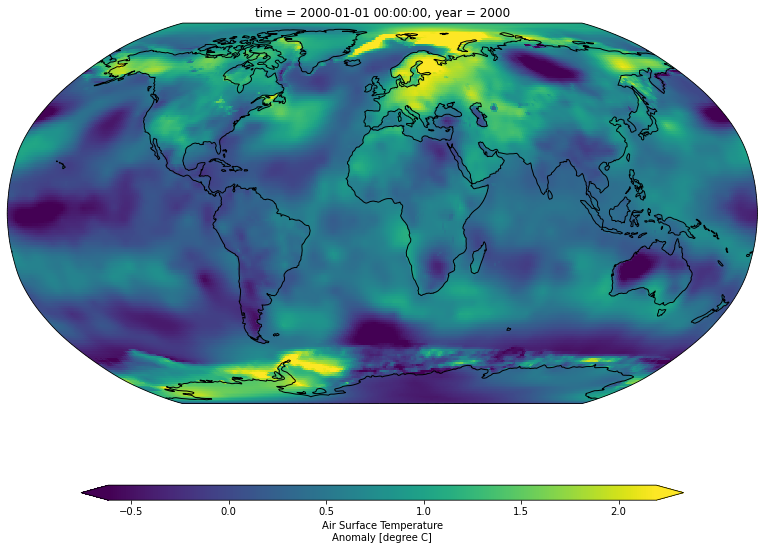

In [72]:
mapplot(annual_mean[150])

In [109]:
##ANNUAL MEAN FINAL
BE_mean

<xarray.DataArray 'temperature' (time: 272, lat: 180, lon: 360)>
array([[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
...
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]],

       [[-0.22571059, -0.22652058, -0.22731594, ..., -0.22328475,
         -0.22409511, -0.22490148],
        [-0.16333145, -0.16542611, -0.16754201, ..., -0.15718092,
         -0.15920818, -0.16125861],
        [-0.09058963, -0.094356  , -0.09807682, ..., -0.07917155,
         -0.08295495, -0.08679927],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]]])
Coordinates:
  * lon      (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
  * lat      (lat) float32 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * time     (time) object 1750-01-01 00:00:00 ... 2021-01-01 00:00:00
    year     (time) int64 1750 1751 1752 1753 1754 ... 2017 2018 2019 2020 2021
Attributes:
    units:          degree C
    standard_name:  surface_temperature_anomaly
    long_name:      Air Surface Temperature Anomaly
    valid_min:      -16.157808962976674
    valid_max:      17.801603062683395

# The 20th CR Reanalysis
- doesn't contain any nans, so whole 20th century can be used for regression (for instance)

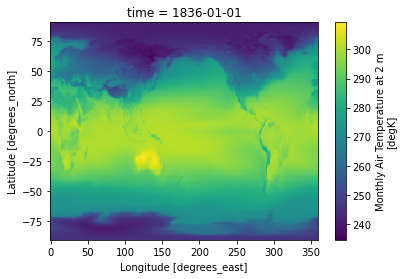

In [8]:
path_20cr='/home/mchoblet/raw_data/calibration/air.2m.mon.mean.nc'
cr20=xr.open_dataset(path_20cr)
cr20['air'][0].plot()

In [9]:
#number of nans
np.count_nonzero(np.isnan(cr20['air'].values))

0

In [10]:
#number of zero values
len(cr20['air'].values.reshape(-1))-np.count_nonzero((cr20['air'].values))

0

In [11]:
cr20_mean=dataloader.annual_mean(cr20['air'])

# Proxy selection: Icecores that have at least 20 values after 1956/1900

- How many icecores over the last millenium are left after that selection?

In [12]:
###WRAPPER FOR MAKING THE PROXY TABLE

def iso2k_table(path='/home/mchoblet/raw_data/proxies/iso2k/iso2k1_0_0.pkl',start=0,end=2013,minrecords=20,min_start=1951,min_end=1980):
    #read in file, select permil, glacier ice, d18O, primary time series=True or missing
    TS=proxy_loader.read_iso_pkl(path)
    #change TS to a table with nans where no time available
    #time is rounded to the nearest integer, multiple values per year are rounded
    table=proxy_loader.make_table(TS,start=start,end=end)



    #only select records which have at least 30 values between 850 and 1850 (39 or 30 doesn't change anything actually)
    #doesn't throw out the rest of the time

    table_minimum=proxy_loader.minimum_of_records(table,minrecords,(min_start,min_end))
    #table_minimum=minimum_of_records(table,20,(0,2013))


    #slice down table 
    table_cut=proxy_loader.cut_time(table_minimum,start,end)
    #eject crap value sites (theres one down to -150)
    for s in table_cut.site:
        mini= np.nanmin(table_cut.sel(site=s).values) 
        if mini<-60:
            table_cut=table_cut.where(table_cut.site!=s,drop=True)



    table_cut=proxy_loader.drop_empty(table_cut)
    print('Final number of records',len(table_cut.site))

    ##fix longitudes: https://stackoverflow.com/questions/46962288/change-longitude-from-180-to-180-to-0-to-360
    table_cut.coords['lon'] = table_cut.coords['lon'] % 360
    table_cut= table_cut.sortby(table_cut.lon)
    return table_cut

In [13]:
def availability(array,labels,title,colors=['violet','blue','brown'],savefig=None):
    
    sns.set_theme()

    mpl.rcParams['xtick.labelsize'] = 25
    mpl.rcParams['ytick.labelsize'] = 25
    plt.rc('legend',**{'fontsize':30})
    
    plt.figure(figsize=(10,4))
    for i,a in enumerate(array):
        a.count(dim='site').plot(label=labels[i],color=colors[i])

    plt.ylabel('Number of records',fontsize=25)
    plt.xlabel('Time',fontsize=25)
    legend=plt.legend(title='Database',fontsize=20)
    legend.get_title().set_fontsize('20')
    #plt.axvline(cftime.DatetimeNoLeap(850,1,1),c='black',ls='--')
    
    #plt.text(cftime.DatetimeNoLeap(850,1,1),-12.5,'850',rotation=0,fontsize=30)
    plt.title(title,fontsize=30)
    
    if savefig is not None:
        plt.savefig('/home/ldap-server/draco/notebooks/paleoda/paleoda/plots/availability.pdf', format='pdf',bbox_inches='tight')


In [14]:
def location_plots(array,labels,title,colors=['violet','blue','brown'],savefig=None):
    """ 
    Plot location of arrays in array [array1, array2,...] on map
    
    savefig: None or path
    """
    ###LOCATIONS
    sns.set_theme(style="white")
    plt.figure(figsize=(20,8))

    mpl.rcParams.update({'font.size': 22})

    #Define projection
    ax = plt.axes(projection=ccrs.PlateCarree())

    # add coastlines
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=1)
    #ax.stock_img()

    #add lat lon grids
    gl = ax.gridlines(draw_labels=True, color='grey', alpha=0.8, linestyle='--')
    gl.top_labels = False
    gl.ylabels_right = False
    ax.set_extent([-180, 180, -90, 90])
    
    for i,k in enumerate(array):
        ax.scatter(k.lon,k.lat,s=100,c=colors[i],edgecolor='black',alpha=0.5,transform=ccrs.PlateCarree(),label=labels[i])
    
    plt.legend(fontsize=20,loc='center left')
    plt.title(title,fontsize=25)
    # y-axis
    ax.text(-0.04, 0.5, 'Latitude', va='bottom', ha='center',
            rotation='vertical', rotation_mode='anchor',
            transform=ax.transAxes,fontsize=20)
    # x-axis
    ax.text(0.5, -0.08, 'Longitude', va='bottom', ha='center',
            rotation='horizontal', rotation_mode='anchor',
            transform=ax.transAxes,fontsize=20)
    

In [15]:
#for fitting to berkeley earth
iso2k_1956=iso2k_table(path='/home/mchoblet/raw_data/proxies/iso2k/iso2k1_0_0.pkl',start=0,end=2013,minrecords=20,min_start=1956,min_end=1980)

Dataset reduced from  198  glacier ice records to  165 records
Final number of records 102


In [16]:
#for fitting to 20CR
iso2k_1900=iso2k_table(path='/home/mchoblet/raw_data/proxies/iso2k/iso2k1_0_0.pkl',start=0,end=2013,minrecords=20,min_start=1900,min_end=2000)

Dataset reduced from  198  glacier ice records to  165 records
Final number of records 136


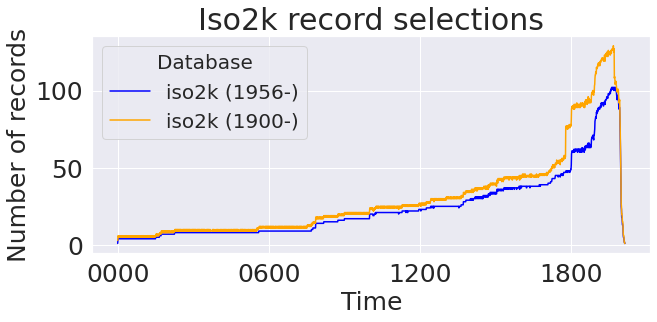

In [17]:
availability([iso2k_1956,iso2k_1900],labels=['iso2k (1956-)','iso2k (1900-)'],title='Iso2k record selections',colors=['blue','orange'])

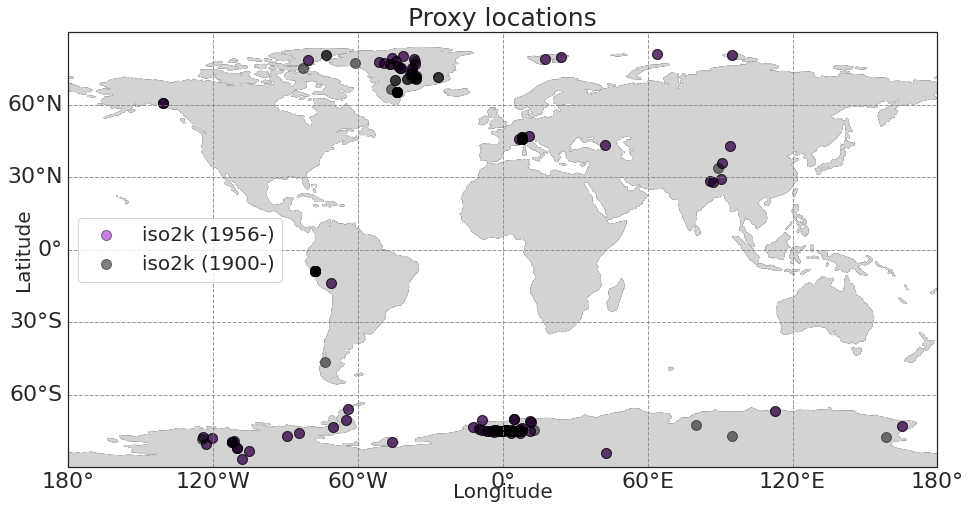

In [57]:
location_plots([iso2k_1956,iso2k_1900],labels=['iso2k (1956-)','iso2k (1900-)'],title='Proxy locations',colors=['darkviolet','black'],savefig=None)

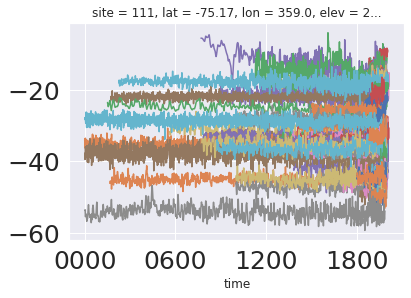

In [18]:
#quick check if there are no superweird extremes
maxi=[]
mini=[]
for s in iso2k_1956.site:
    t=iso2k_1956.sel(site=s).dropna('time')
    maxi.append(np.max(t.values.tolist()))
    mini.append(np.min(t.values.tolist()))
    t.plot()
    #plt.show()

## Calibration of proxy-table to instrumental datasets

* use the linregress function from scipy.linalg
* option to specify the anomaly-time (must be within bounds of instrumental dataset)
* functions returns adapted proxy_data table which contains slope, intercept and error


In [20]:
def regress_proxies(proxy_data,instrumental_data,regress_start=1956,anom=True,anom_time=[1956,1980],norm=False):
    #exchange instrumental_data time (annoying slicing calendar thing)
    instrumental_data['time']=xr.cftime_range(start=str(instrumental_data.time.dt.year[0].values.tolist()),end=str(instrumental_data.time.dt.year[-1].values.tolist()),freq='YS',calendar='noleap')
    
    if anom:
        #create separate time objects for slicing (.sel(time=slice) has a calendar bug)
        start=cftime.datetime(anom_time[0], 1, 1, 0, 0, 0, 0, calendar='365_day')
        end=cftime.datetime(anom_time[1], 1, 1, 0, 0, 0, 0, calendar='365_day')

        try:
            proxy_data=proxy_data-proxy_data.sel(time=slice(start,end)).mean('time')
        except:
            proxy_data=proxy_data-proxy_data.sel(time=slice(str(anom_time[0]),str(anom_time[1]))).mean('time')

        try:
            instrumental_data=instrumental_data-instrumental_data.sel(time=slice(start,end)).mean('time')
        except:
            instrumental_data=instrumental_data-instrumental_data.sel(time=slice(str(anom_time[0]),str(anom_time[1]))).mean('time')

    if norm:
        proxy_data=proxy_data/proxy_data.nanstd('time')
        instrumental_data=instrumental_data/instrumental_data.nanstd('time')

    regress_start=cftime.datetime(regress_start, 1, 1, 0, 0, 0, 0, calendar='365_day')

    proxy_data=proxy_data.sel(time=slice(regress_start,None))
    
    #do the linear regression
    slope_a=[]
    intercept_a=[]
    error_a=[]

    #proxy
    proxies=[]
    #instrumental_temp
    instrumental=[]
    times=[]

    for site in proxy_data.site:
        record=proxy_data.sel(site=site).dropna('time')
        lat=record['lat']
        lon=record['lon']
        anomalies=[]
        record_vals=record.values

        #get temperature from instrumental data
        id_proxy=instrumental_data.sel(lat=lat,lon=lon,method='nearest')
        for time in record.time.values:
            time_vals=id_proxy.sel(time=time,method='nearest')
            anomalies.append(time_vals.values.tolist())
        try:
            slope, intercept, r, p, se =linregress(anomalies,record_vals)
            slope_a.append(slope)
            intercept_a.append(intercept)
            error_a.append(se)
            proxies.append(record_vals)
            instrumental.append(anomalies)
            times.append(record.time.values)
        except:
            #drop site
            #import pdb
            #pdb.set_trace()
            
            proxy_data=proxy_data.where(proxy_data.site!=site.values.tolist(),drop=True)
            print('no record for site ',site.values.tolist())
    
    try:
        proxy_data['slope']=('site',slope_a)
        proxy_data['intercept']=('site',intercept_a)
        proxy_data['error']=('site',error_a)
    except:
        import pdb
        pdb.set_trace()
    
    return proxy_data,proxies,instrumental,times

In [40]:
iso2k_cr20,proxies_cr20,instrumental_cr20,times_cr20=regress_proxies(iso2k_1900,cr20_mean,regress_start=1900,anom=True,anom_time=[1900,2000],norm=False)

In [41]:
iso2k_BE,proxies_BE,instrumental_BE,times_BE=regress_proxies(iso2k_1956,BE_mean,anom=True,anom_time=[1956,1990],norm=False)

In [23]:
def plot_ts(proxy_new,instrumental,proxies,times):
    """
    proxy_new: the new proxy-table that contains the slope
    instrumental: the corresponding instrumental values (same length has proxy-new after dropping the nans)
    proxies: proxy-values where there is also instrumental data
    """
    for i,site in enumerate(proxy_new.site):
        print(site.values.tolist())
        print(site.lat.values,site.lon.values)
        record=proxy_new.sel(site=site).dropna('time')
        record_c=record.copy()
        lat=record['lat']
        lon=record['lon']
        plt.plot(times[i],proxies[i],'o-',label='d18O')
        plt.plot(times[i],instrumental[i],'o-',label='temp')
        """
        try:
            record_c.data=instrumental[i]
        except:
            import pdb
            pdb.set_trace()
        record_c.plot.line('o-',label='temp')
        """
        #plt.plot(record.time,all_anos[i])
        #annual_mean.sel(latitude=lat,longitude=lon,method='nearest')[206:].plot.line('o-',label='temp')
        plt.ylim(-4,4)
        title_str='slope: ' + str(np.round(proxy_new['slope'][i].values.tolist(),2))
        #plt.xlim('1900','2000')
        plt.title(title_str,fontsize=20)
        plt.yticks([])
        plt.legend(fontsize=15)
        plt.plot()
        plt.show()
    return

92
-75.0 0.01


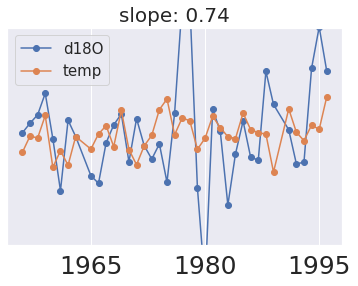

127
-75.0 0.01


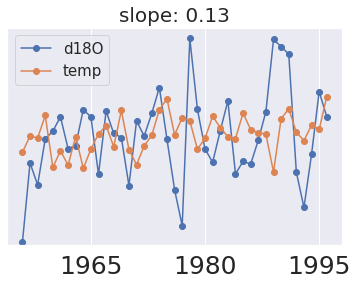

103
-75.0 0.04


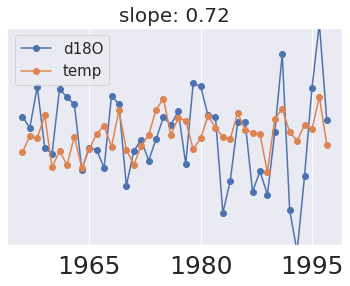

112
-74.75 1.0


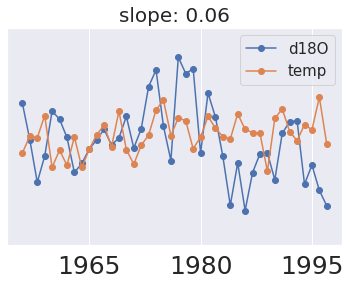

45
-74.88 1.6


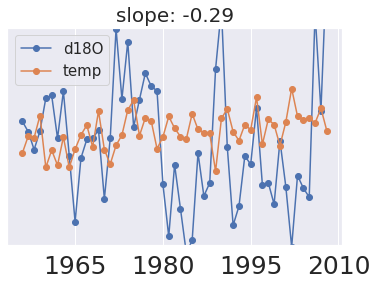

102
-74.5 1.96


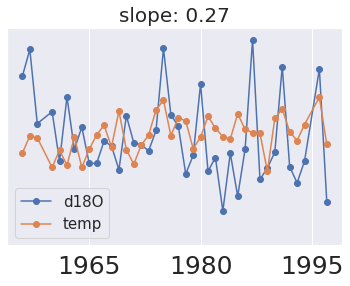

90
-74.49 1.97


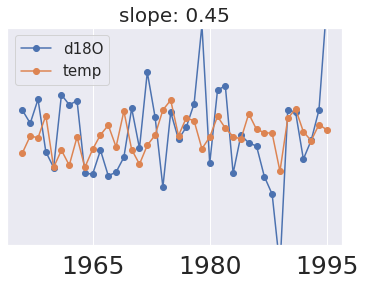

108
-75.08 2.5


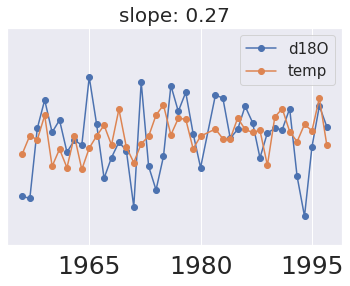

95
-75.75 3.29


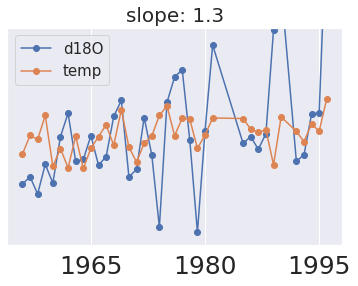

89
-74.97 3.92


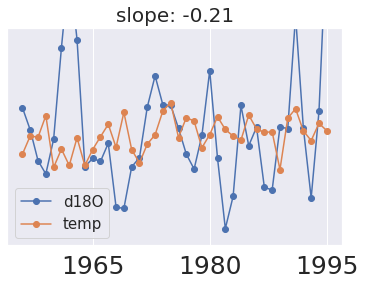

101
-74.97 3.92


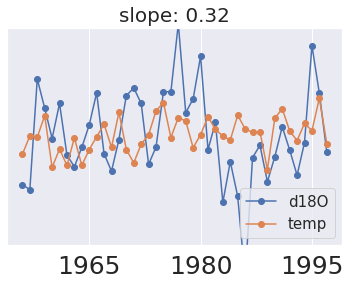

113
-74.67 4.0


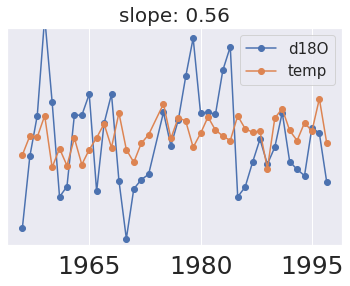

141
-70.24 4.8


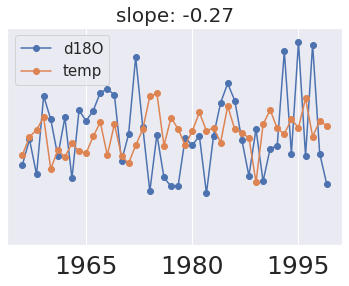

87
-70.25 4.82


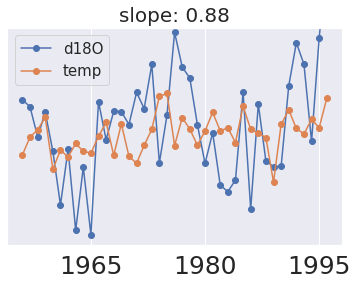

109
-75.17 5.0


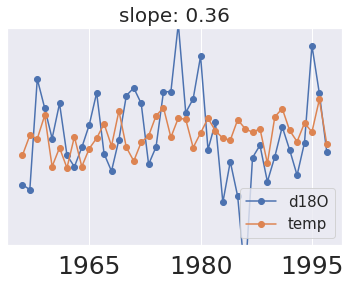

114
-75.08 6.5


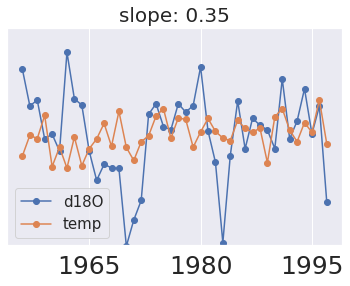

115
-75.25 6.5


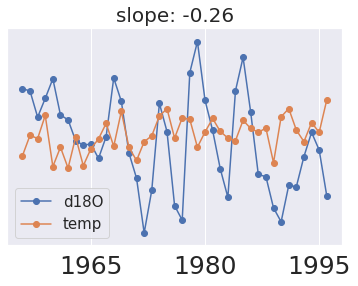

129
-75.17 6.5


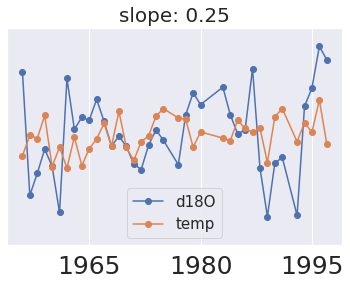

27
45.8411 6.8478


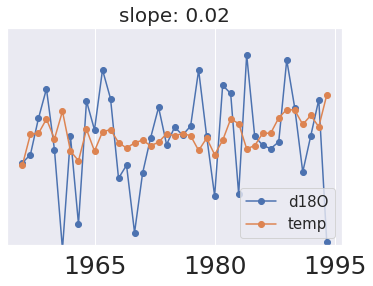

91
-74.41 7.22


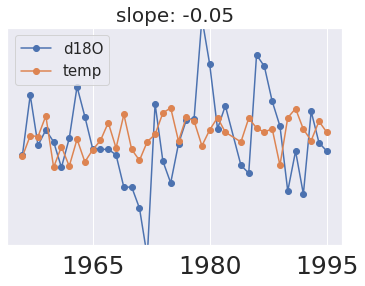

96
-75.93 7.22


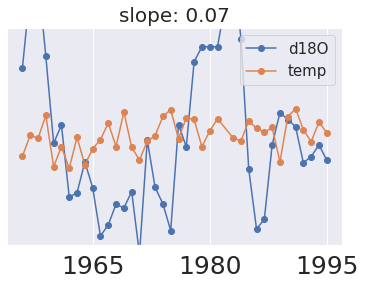

100
45.9244 7.8675


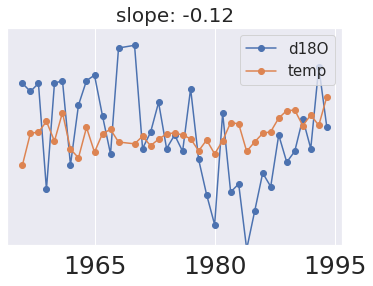

28
45.9297 7.877


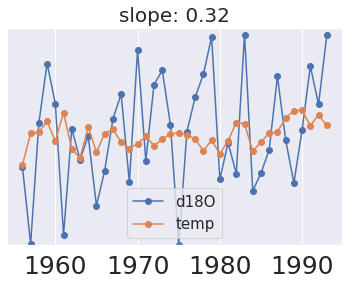

29
45.9297 7.877


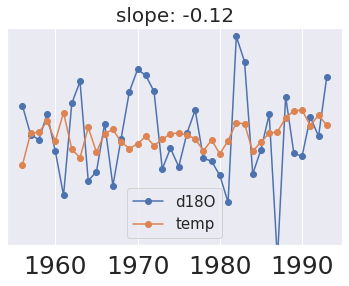

30
45.9297 7.877


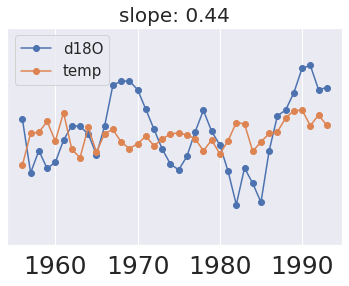

31
45.9297 7.877


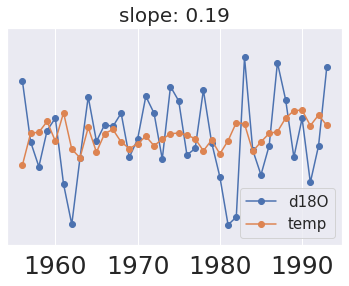

44
-73.72 7.94


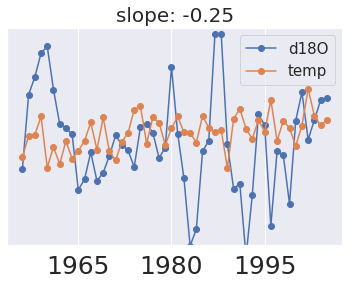

93
-75.0 8.01


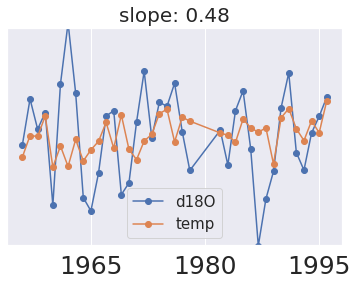

98
46.5481 8.0461


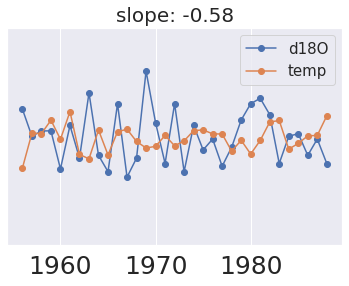

50
46.55 8.07


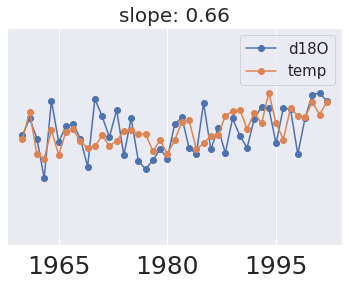

68
46.8842 10.8256


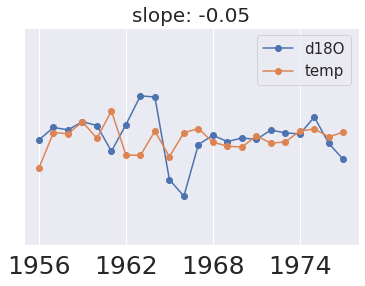

97
-75.22 11.35


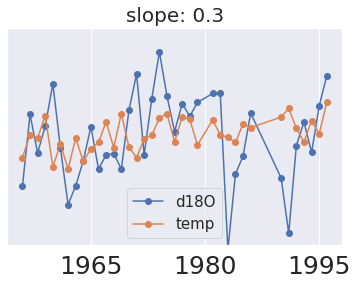

24
-70.86 11.54


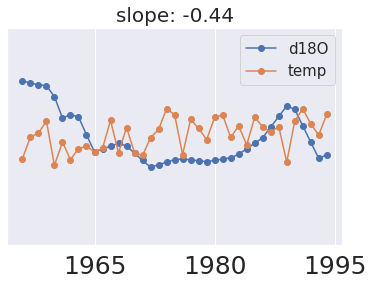

164
-71.34 11.59


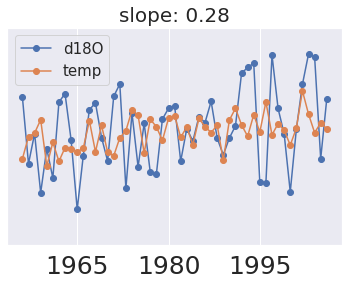

22
78.86 17.42


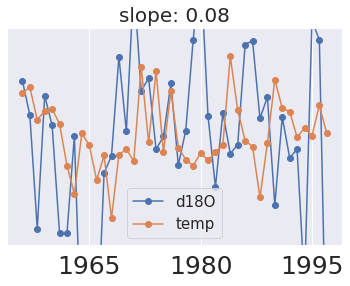

140
79.83 24.0


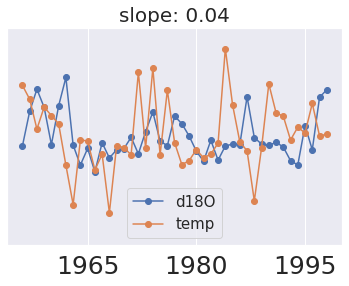

64
43.3483 42.4267


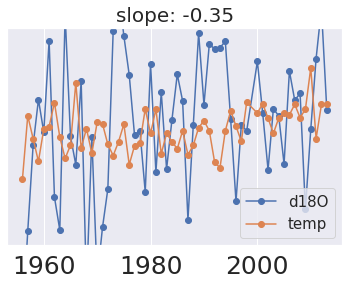

99
-84.0 43.0


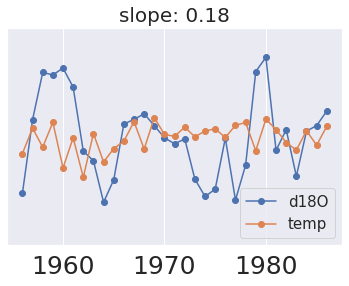

130
81.0 64.0


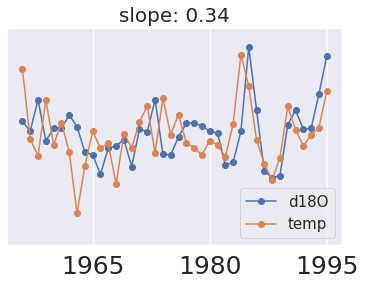

125
28.38 85.72


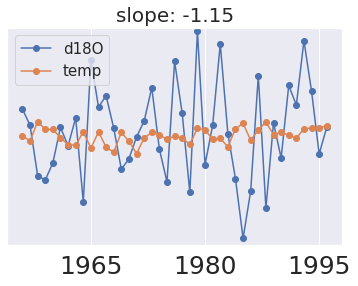

138
27.98 86.92


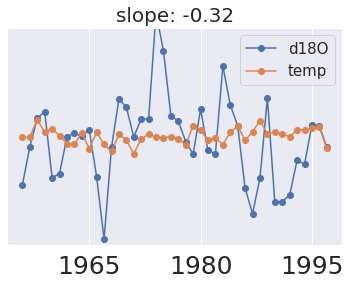

51
29.04 90.2


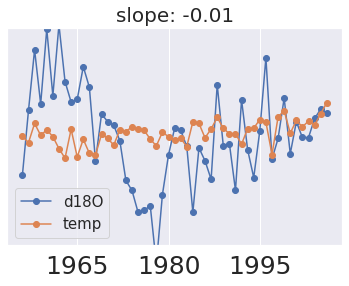

149
35.81 90.76


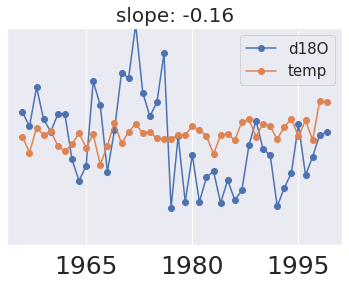

25
43.05 94.32


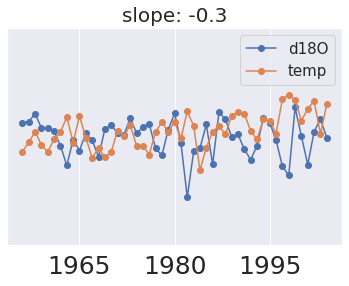

32
80.52 94.82


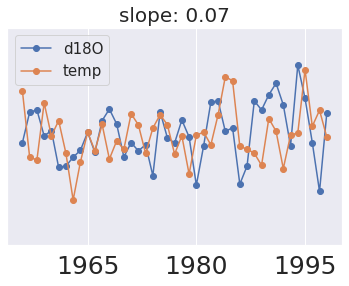

33
-66.77 112.81


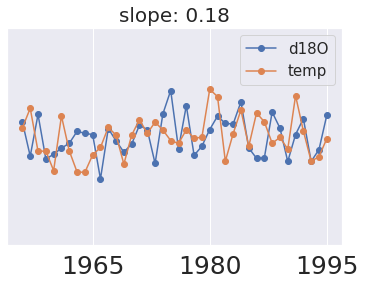

122
-73.1 165.4


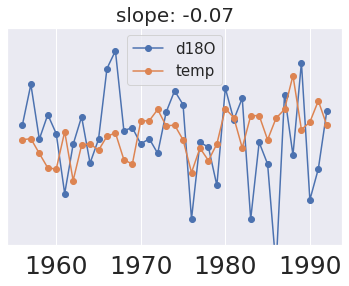

70
60.58 219.42


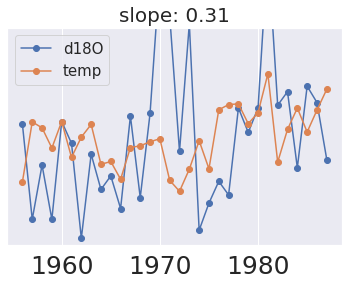

139
60.59 219.5


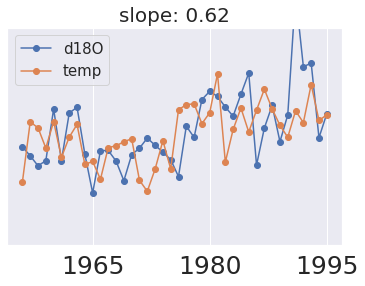

36
-77.68 236.0


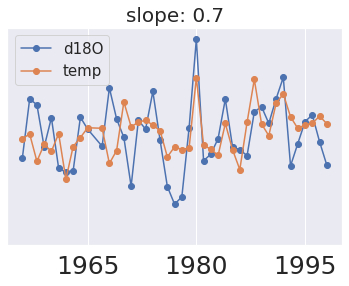

43
-80.62 237.37


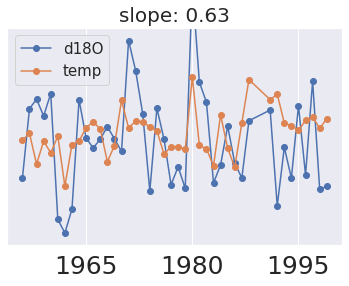

35
-78.08 239.92000000000002


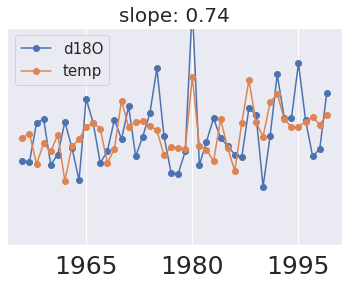

46
-79.46 247.91


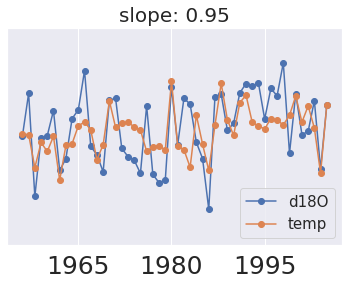

47
-79.46 247.91


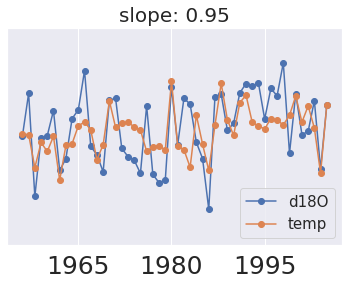

48
-79.46 247.91


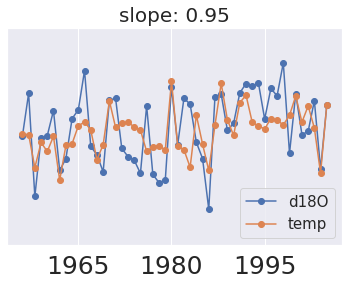

34
-79.38 248.76


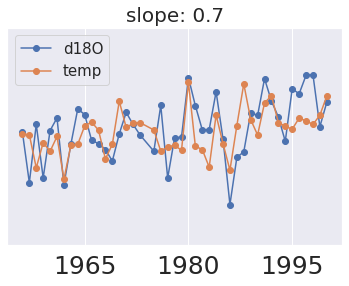

38
-82.0 249.99


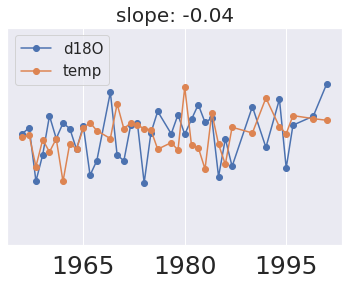

40
-82.0 249.99


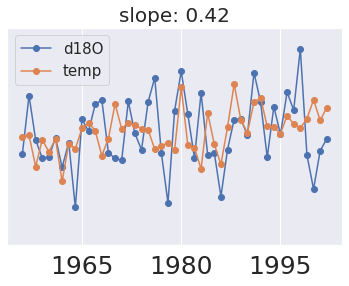

42
-86.5 252.01


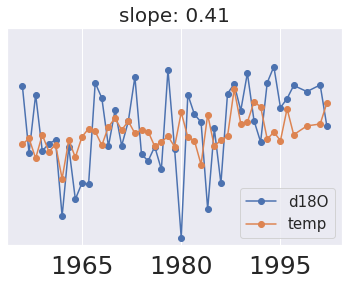

41
-83.5 255.01


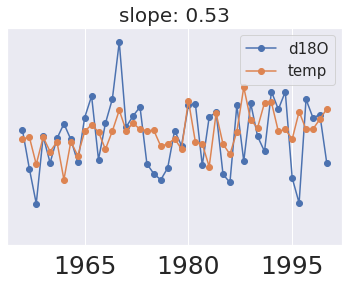

39
-77.06 270.86


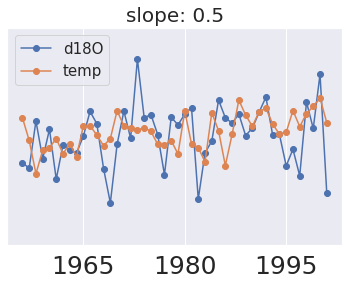

81
-75.92 275.75


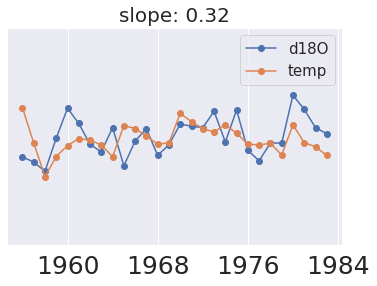

23
78.4 279.6


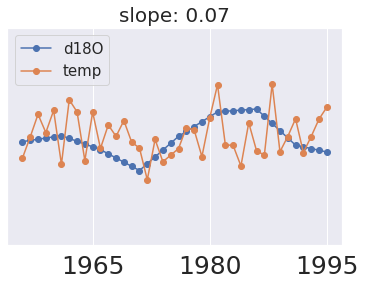

73
-9.0 282.5


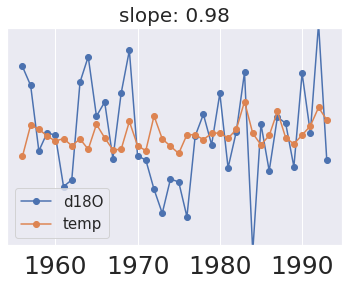

74
-9.0 282.5


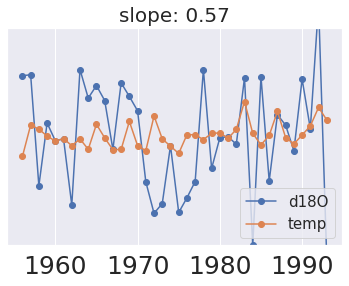

75
-9.0 282.5


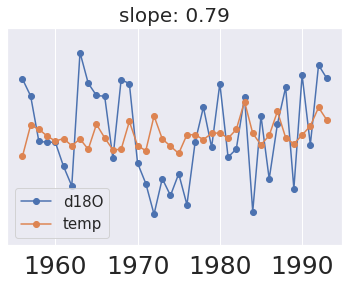

76
-9.0 282.5


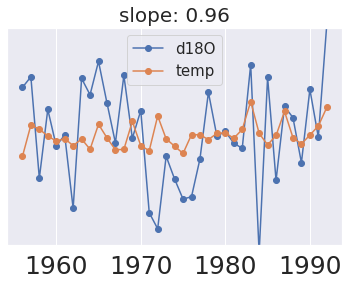

77
-9.0 282.5


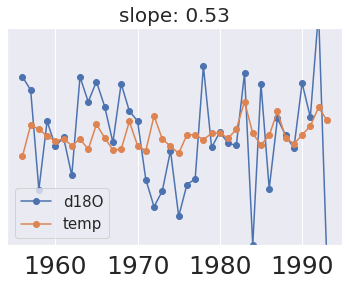

78
-9.0 282.5


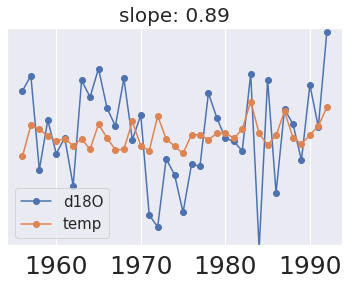

49
-13.9333 289.1667


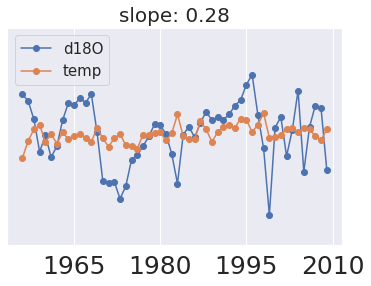

152
-73.59 289.64


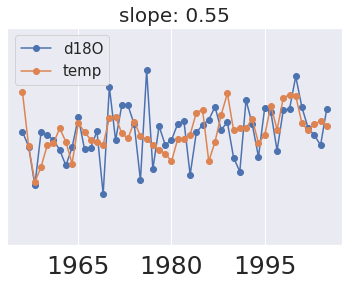

71
-70.68 295.13


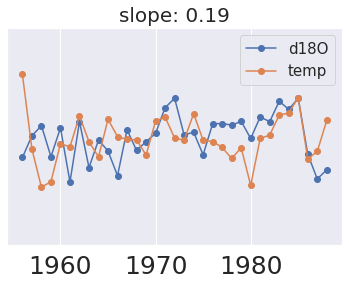

53
-66.04 295.92


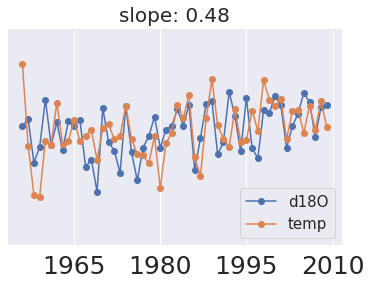

52
77.45 308.94


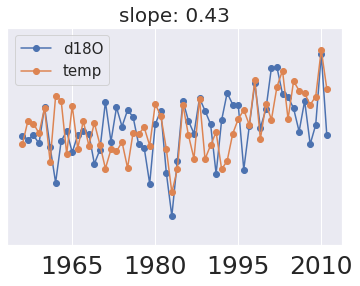

120
77.2533 310.7833


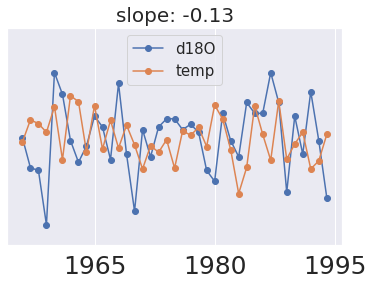

59
76.6594 313.5163


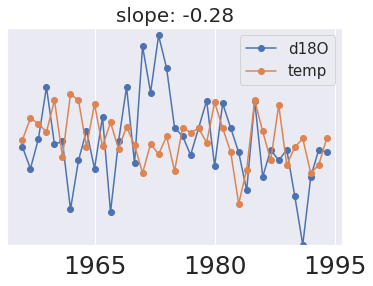

57
79.3414 314.0884


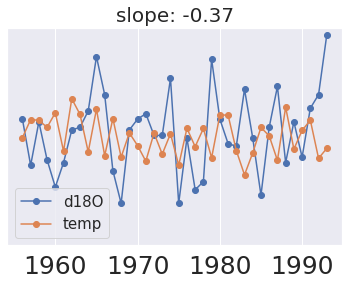

131
-79.57 314.28


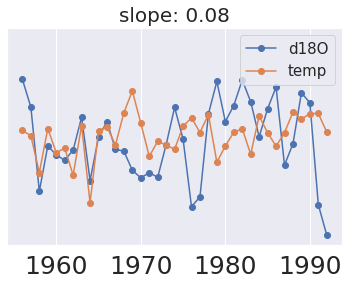

58
78.0 316.0


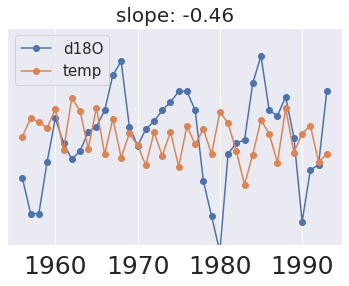

1
65.18 316.17


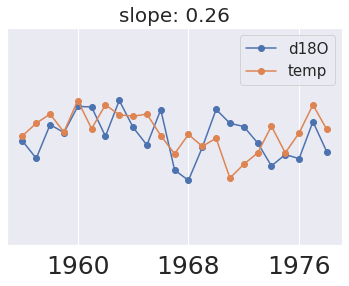

121
76.0039 316.508


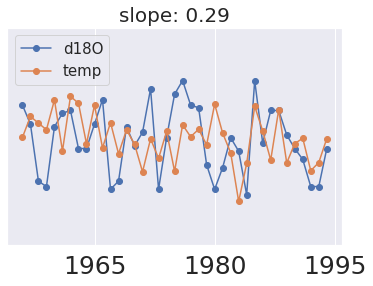

160
75.1 317.68


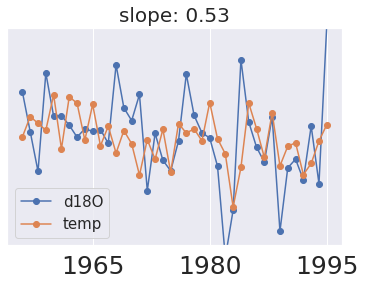

61
75.0016 317.9996


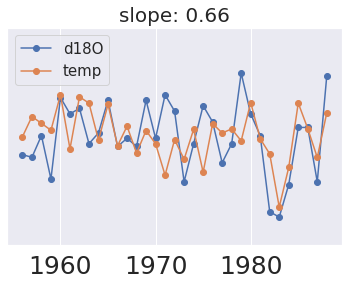

119
80.0 318.8626


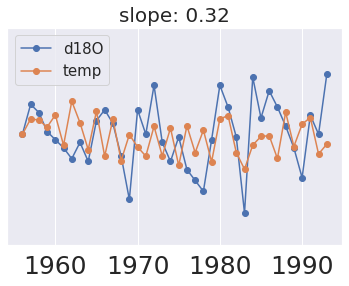

82
72.6 321.5


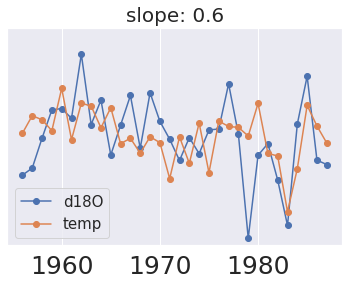

9
72.58 322.36


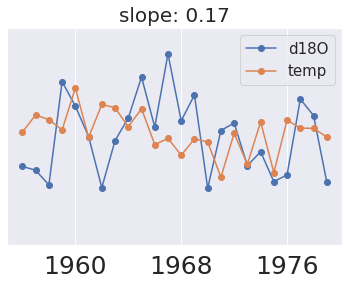

117
73.9402 322.3701


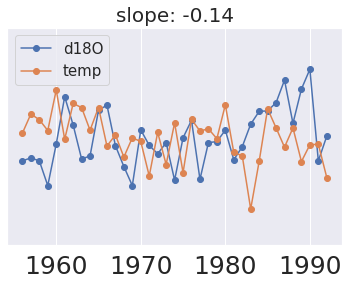

54
75.2504 322.3752


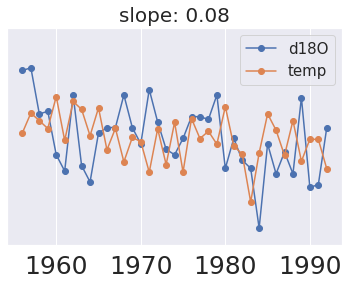

56
78.8333 323.5


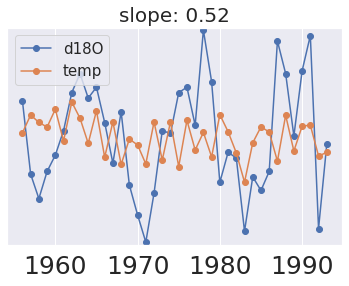

118
76.617 323.5967


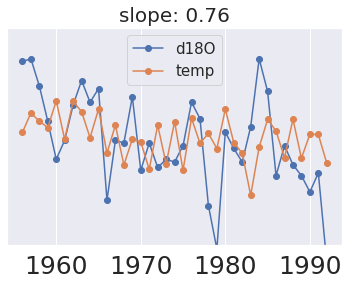

80
-73.6 347.57


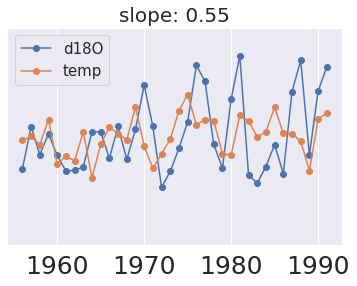

116
-74.21 350.25


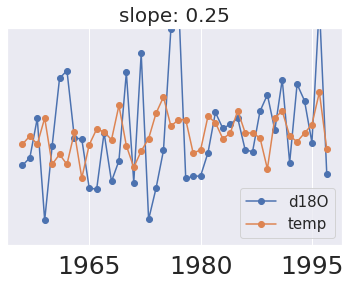

104
-74.85 351.5


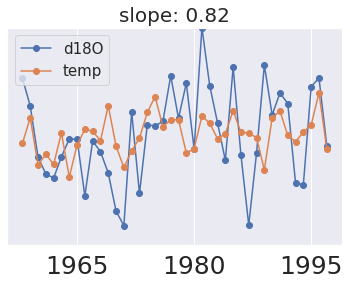

132
-70.62 351.63


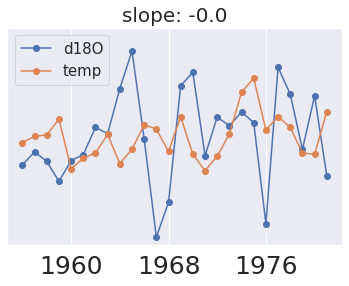

105
-75.0 353.5


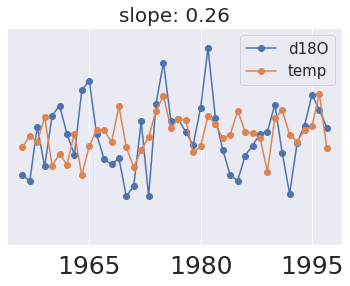

110
-75.25 354.0


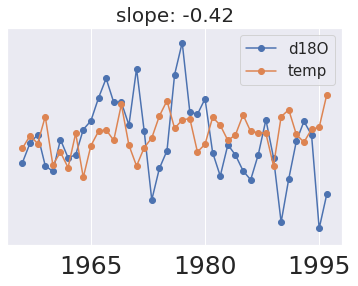

106
-75.0 355.49


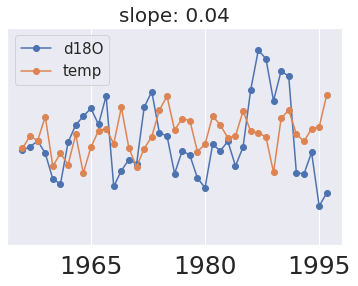

94
-74.59 356.56


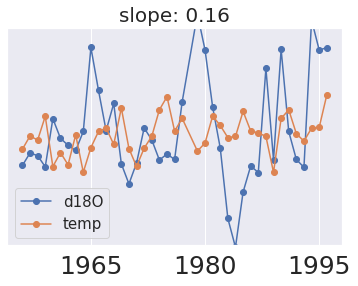

128
-75.58 356.57


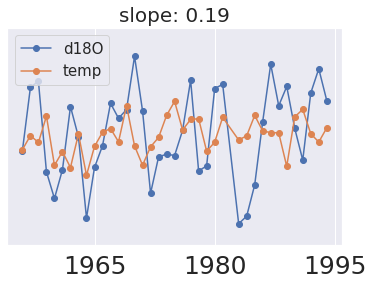

88
-74.86 357.45


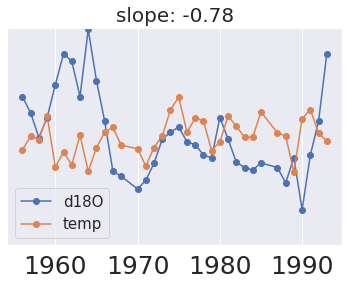

107
-74.96 358.5


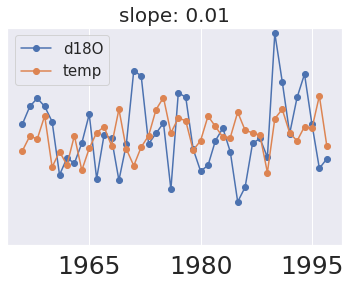

111
-75.17 359.0


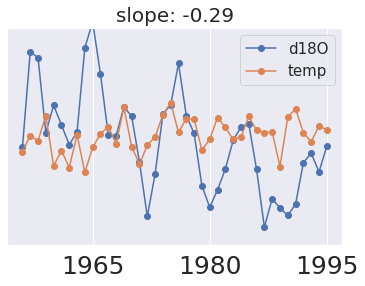

In [188]:
plot_ts(iso2k_BE,instrumental_BE,proxies_BE,times_BE)

In [200]:
db1=[0]
inter=db1
inter[0]+=1
print(db1)
print(inter)

[1]
[1]


In [33]:
def corr_plots(list_prox=[],list_instru=[],list_full=[],names=['BE','20CR']):
    """
    BIT UGLY WORKAROUNDS FOR PLOTTING BOTH DATASETS AT ONCE. 
    
    list_prox: proxy values reduced to where there are some
    lit_instru: reduced instrumental data (to fit proxy data)
    list_full: list of DataArrays containing slopes and intercepts
    """    
    all_sites=np.concatenate([db.site.values.tolist() for db in list_full])
    
    #ugly workaround
    db1=[0]
    db2=[0]
    colors=['blue','red']
    for ii,s in enumerate(all_sites):
        plt.figure(figsize=(5,5))
        for i in range(len(list_prox)):
            if i==0:
                index=db1
            else:
                index=db2
            try:
                site=list_full[i].sel(site=s)
                slpe=site['slope']
                intrcpt=site['intercept']
                
                #augment index to find the right proxy/instrumental value
                index[0]+=1
            
                #import pdb
                #pdb.set_trace()
            
                x=list_instru[i][index[0]]
                plt.scatter(x,list_prox[i][index[0]],color=colors[i])
                print(len()
                #string='fitted line for' + names[i] + 's: ' +str(np.round(slpe,2)) + ', i:' + str(np.round(intrcpt,2))
                plt.plot(x, intrcpt + slpe*x, 'r', ls='--')#,label=string)
                print('bu')
            except:
                print('error')
                pass
            
        plt.legend(fontsize=12)
        plt.show()

    

In [43]:
all_sites=np.concatenate([db.site.values.tolist() for db in list_full])

AttributeError: 'str' object has no attribute 'site'

In [47]:
list_full=[iso2k_BE,iso2k_cr20]
all_sites=np.concatenate([db.site.values.tolist() for db in list_full])

In [50]:
slpe

<xarray.DataArray 'slope' ()>
array(0.16426107)
Coordinates:
    site                  int64 111
    lat                   float64 -75.17
    lon                   float64 359.0
    elev                  float64 2.63e+03
    site name             <U43 'DML Plateau (DML19) FB9805'
    min_time_resolution   float64 1.0
    mean_time_resolution  float64 1.005
    length_of_record      float64 195.0
    number_of_records     float64 195.0
    slope                 float64 0.1643
    intercept             float64 0.002173
    error                 float64 0.2487

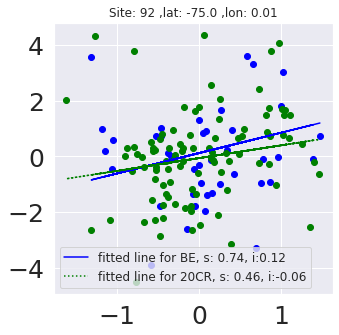

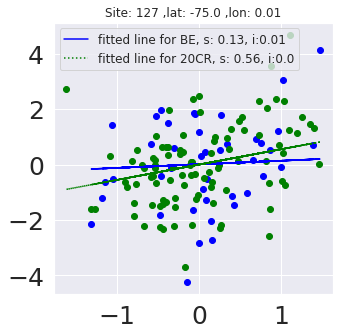

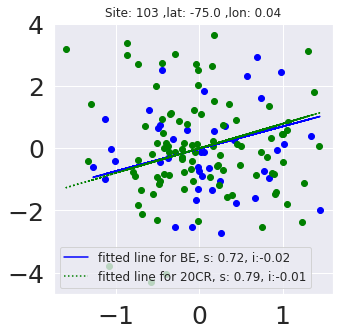

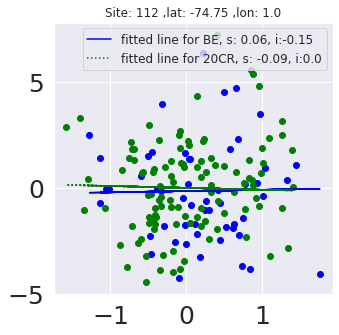

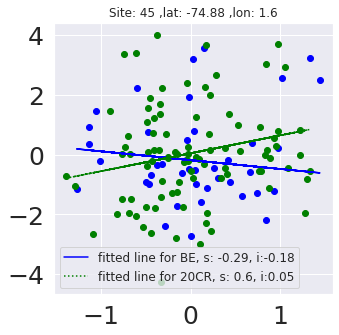

...

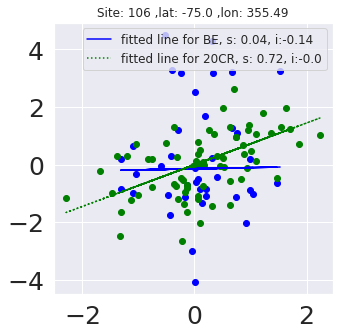

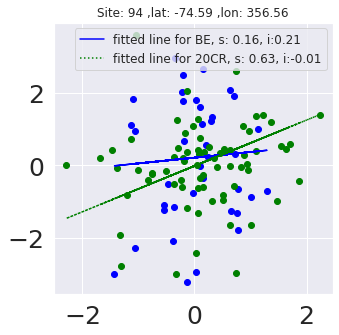

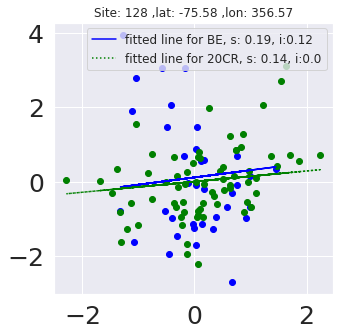

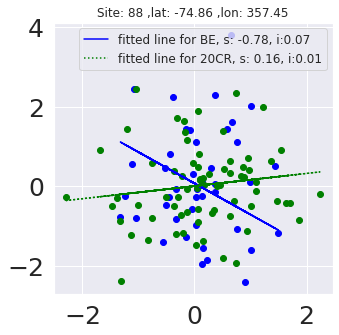

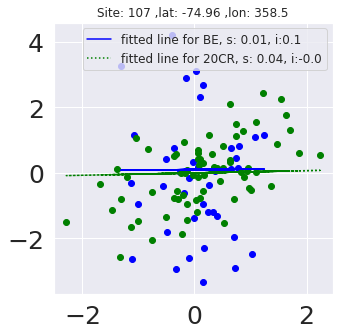

error


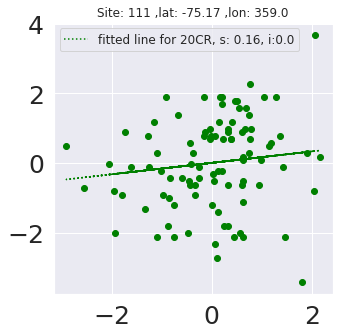

error


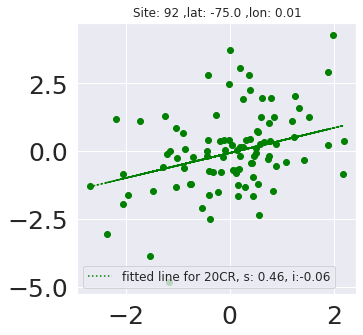

error


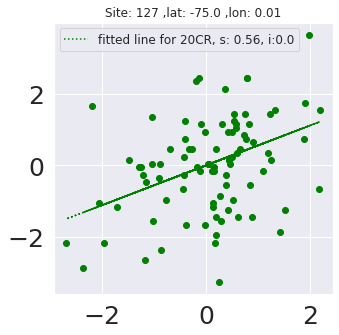

error


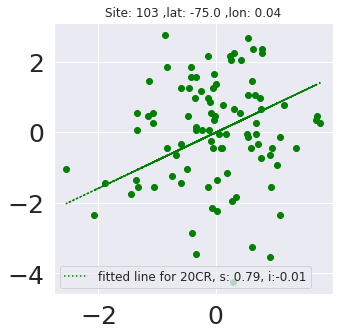

error


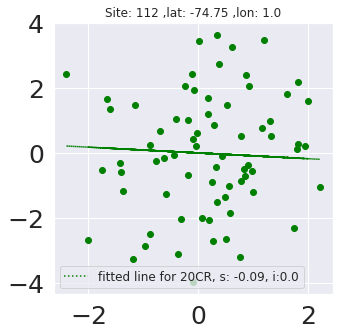

error


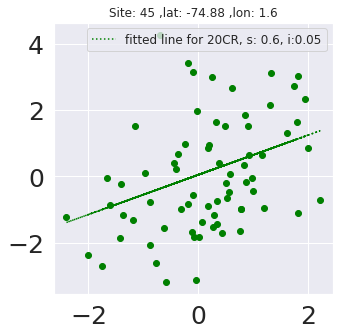

error


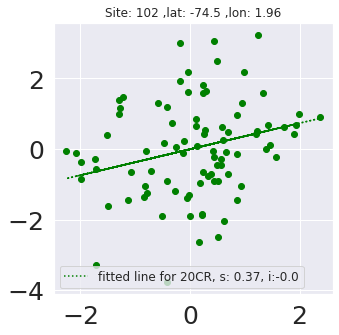

error


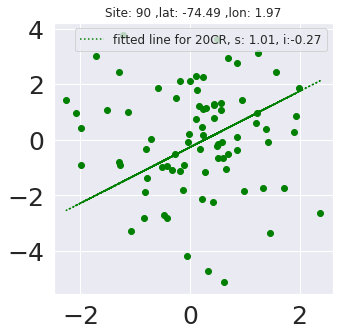

error


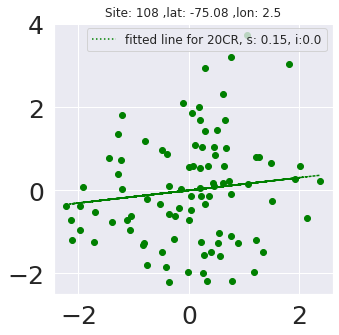

error


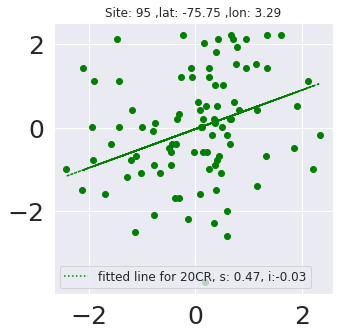

error


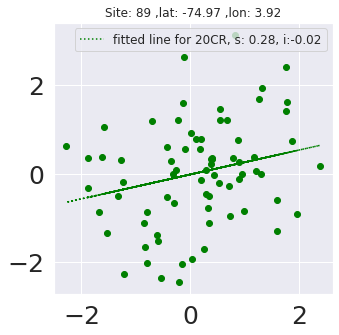

error


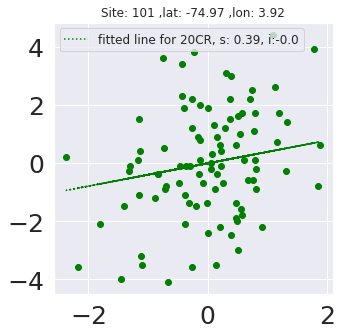

error


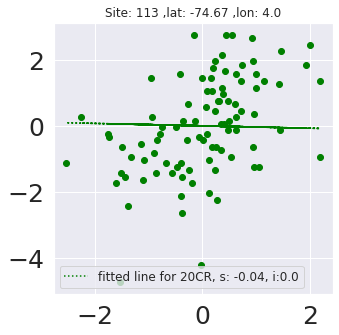

error


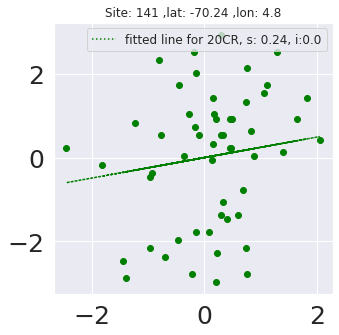

error


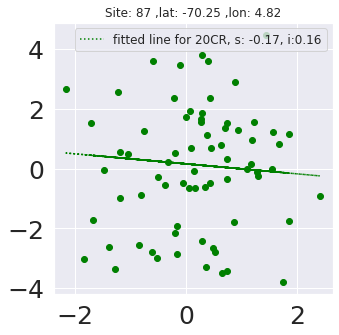

error


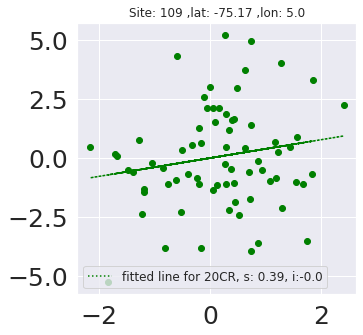

error


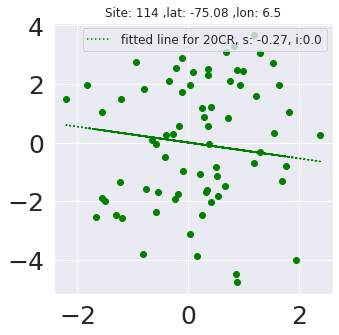

error


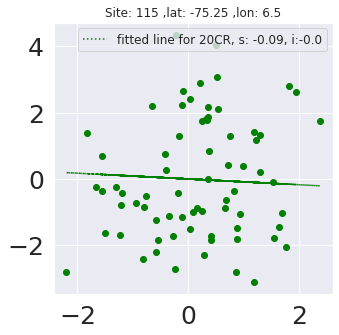

error


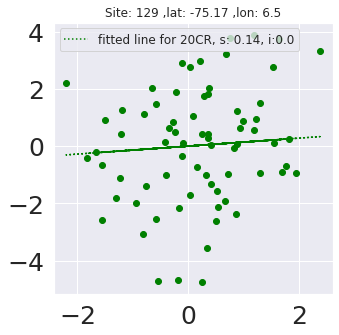

error


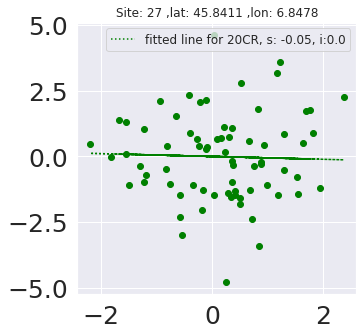

error


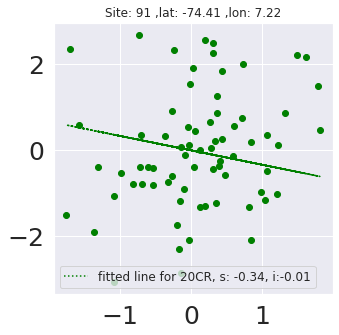

error


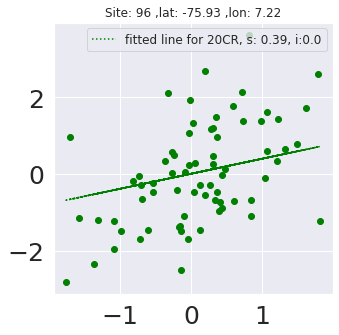

error


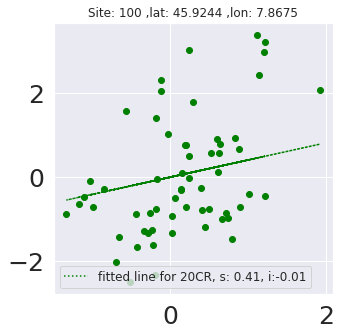

error


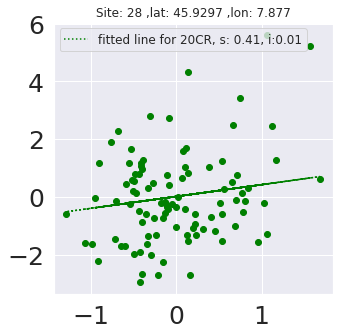

error


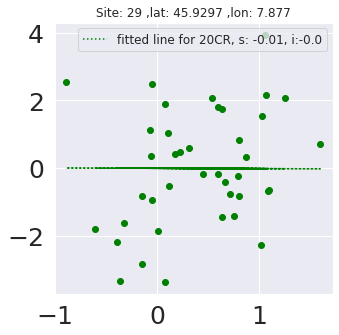

error


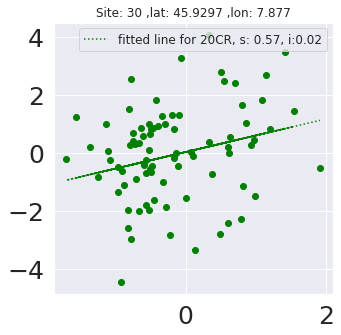

error


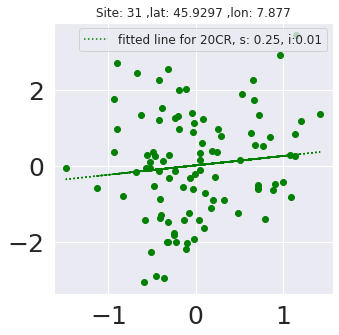

error


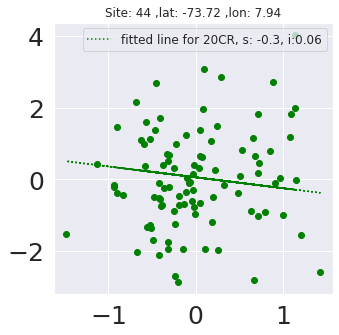

error


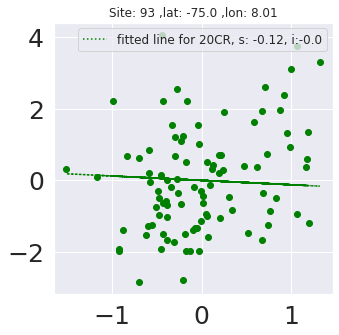

error


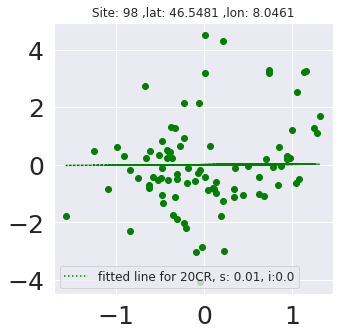

error


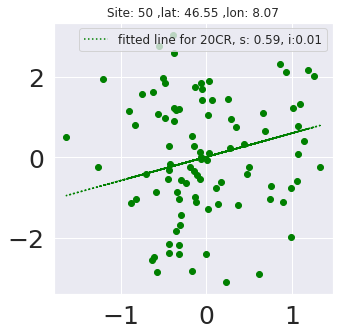

error


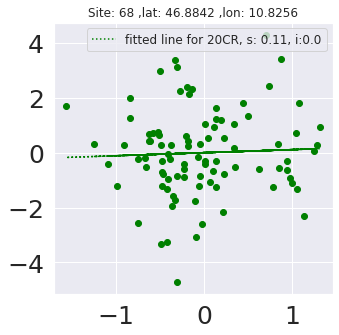

error


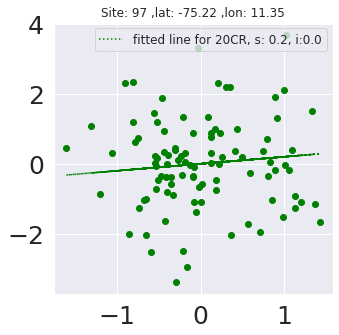

error


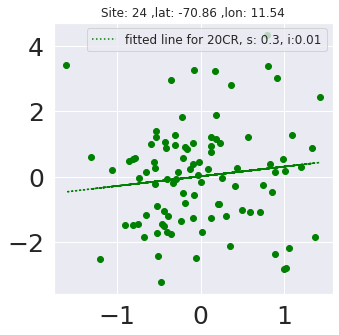

error
error


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


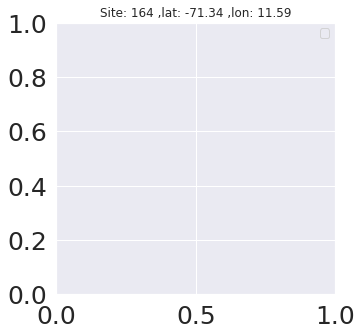

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


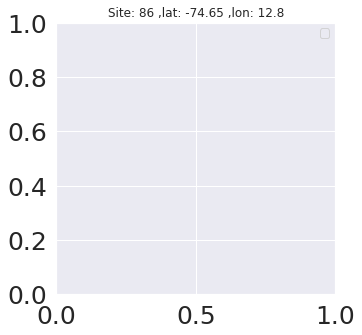

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


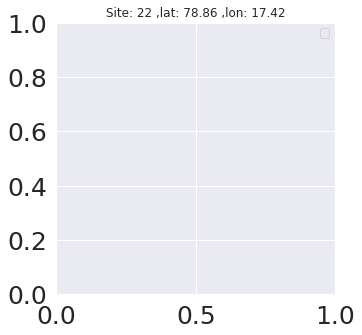

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


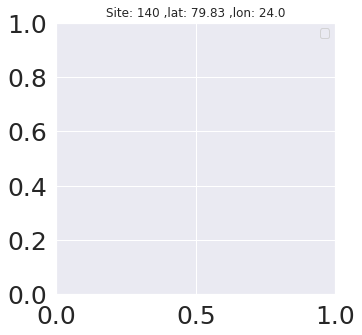

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


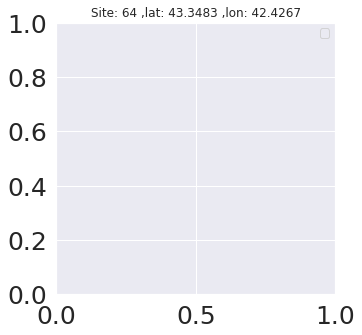

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


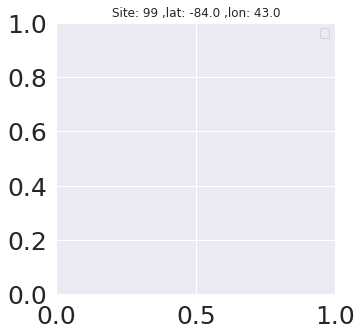

error
error


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


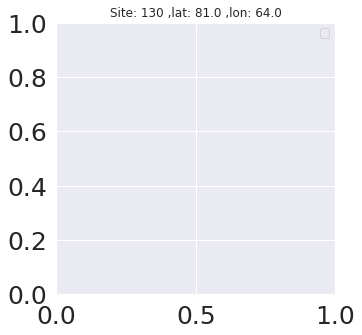

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


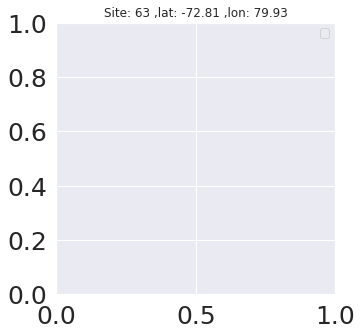

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


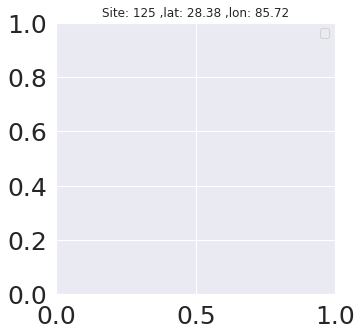

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


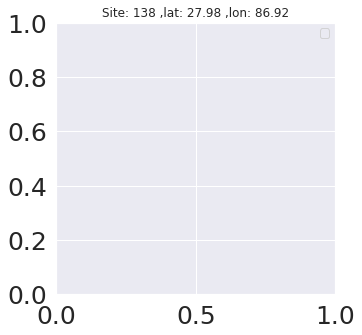

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


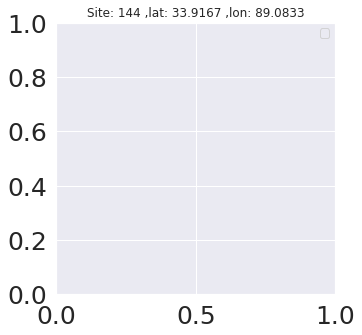

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


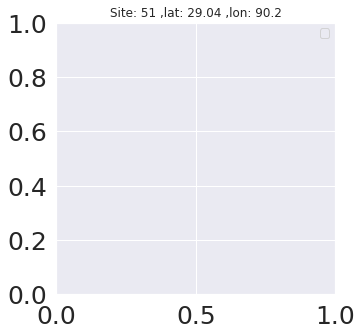

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


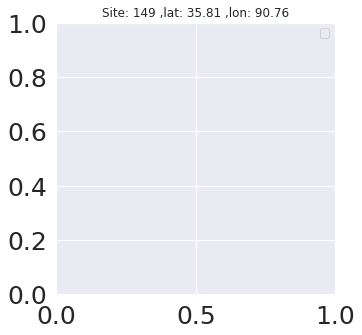

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


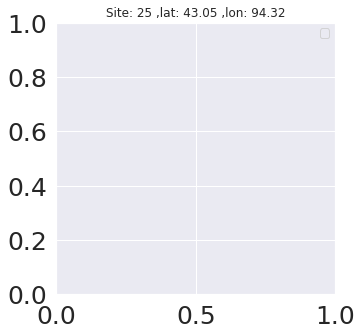

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


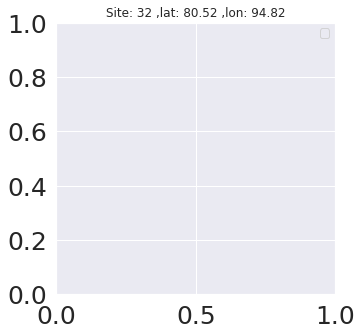

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


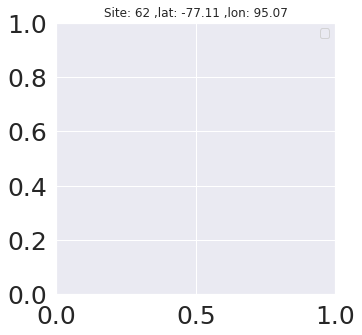

error
error


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


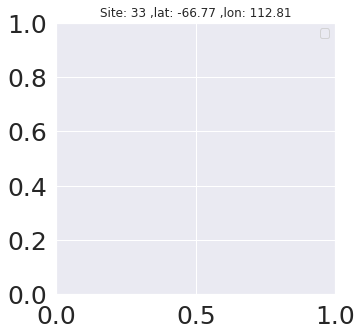

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


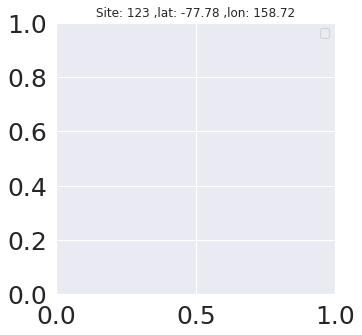

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


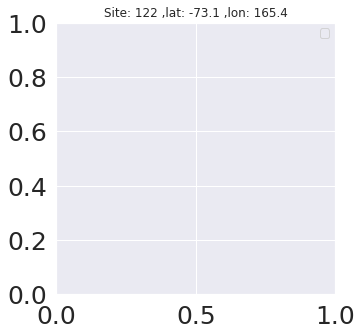

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


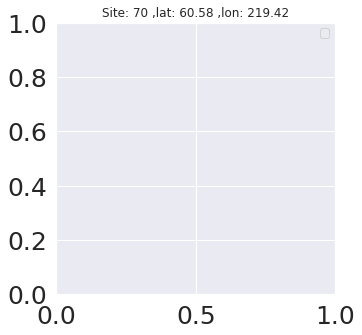

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


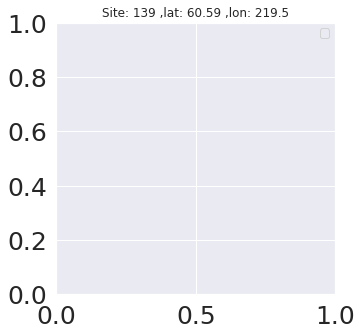

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


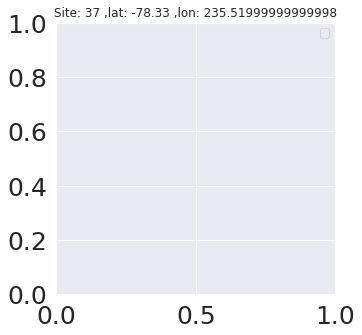

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


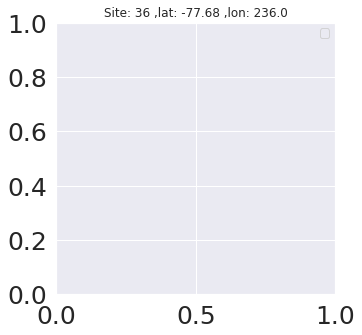

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


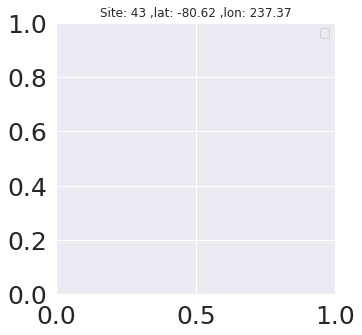

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


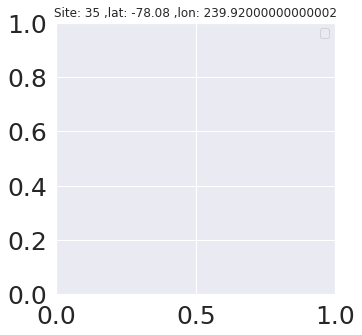

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


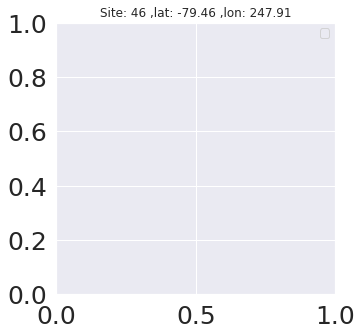

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


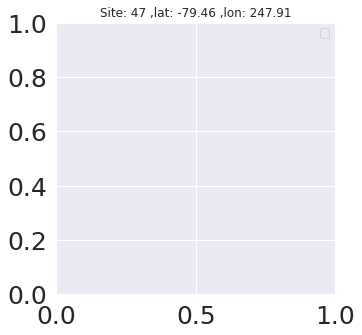

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


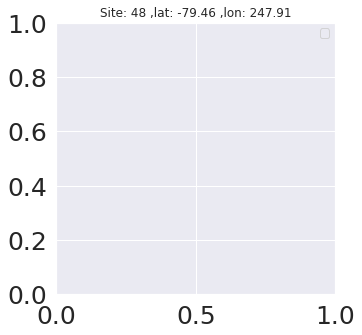

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


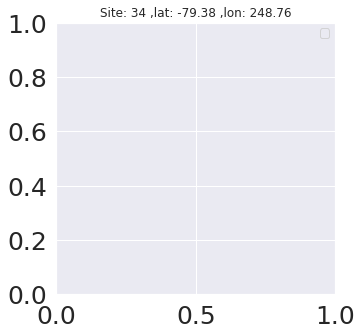

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


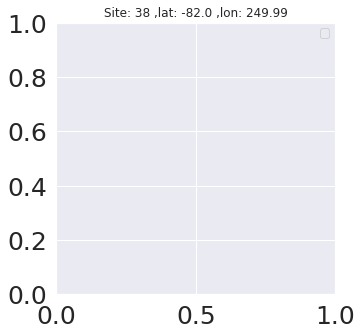

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


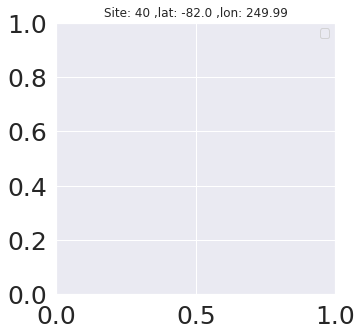

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


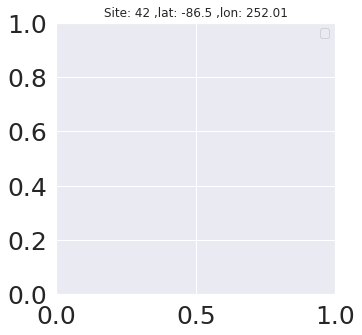

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


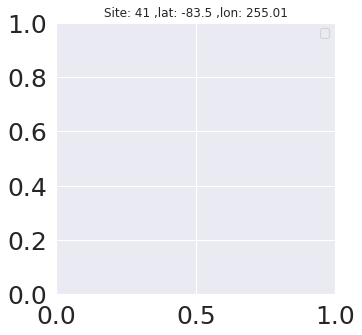

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


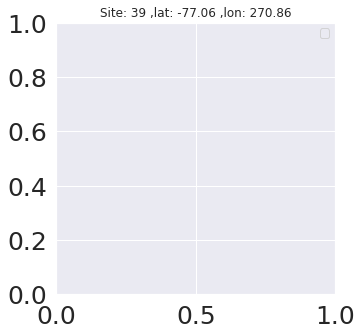

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


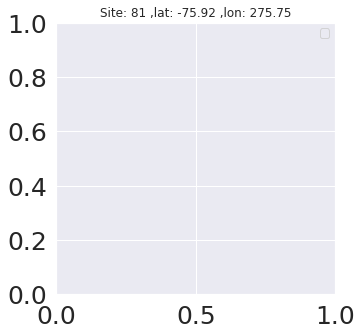

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


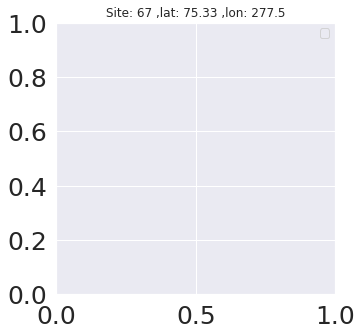

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


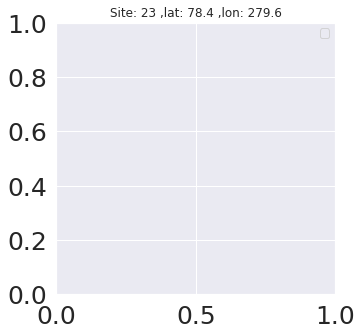

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


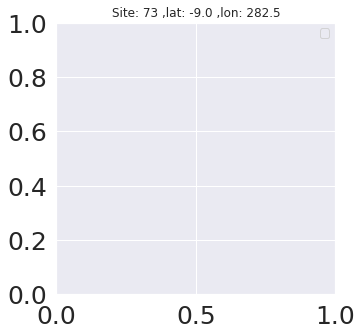

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


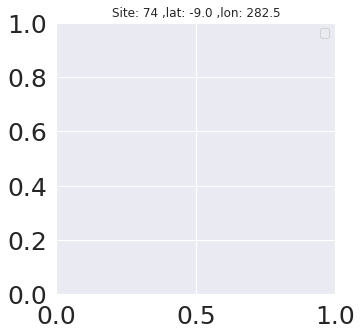

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


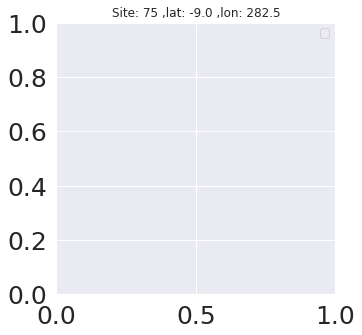

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


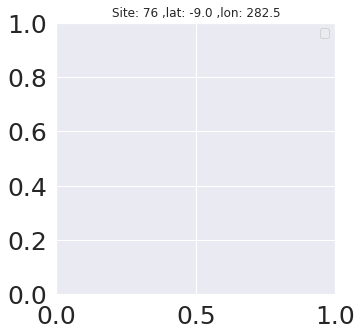

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


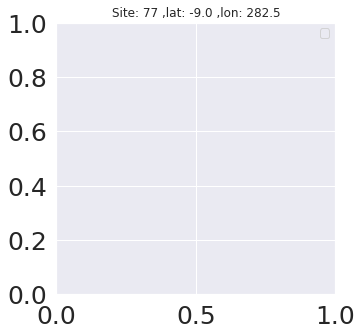

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


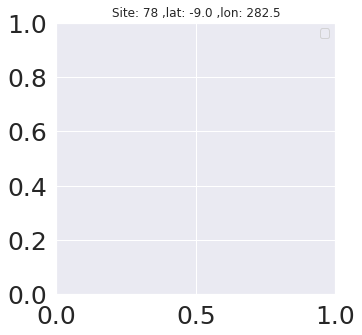

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


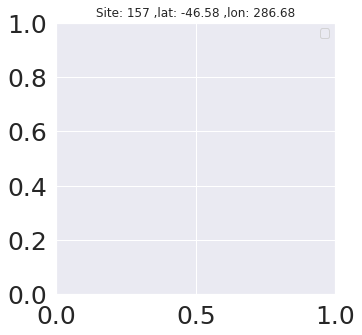

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


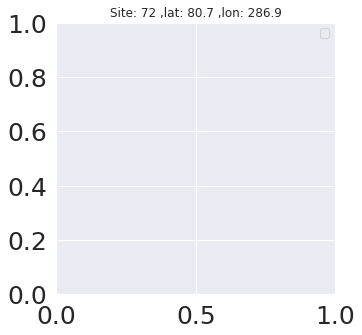

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


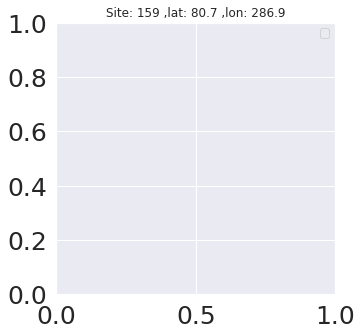

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


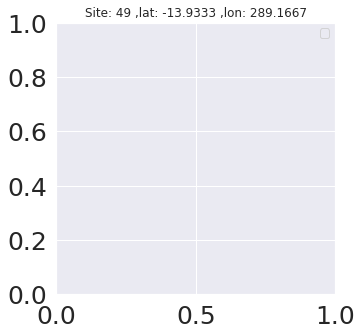

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


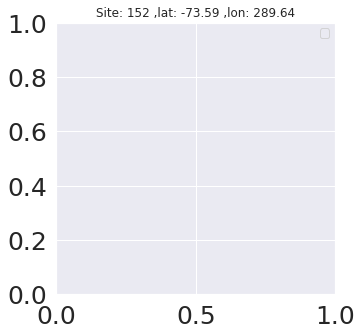

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


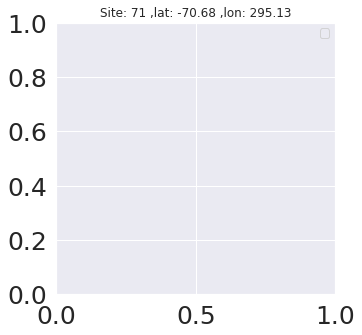

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


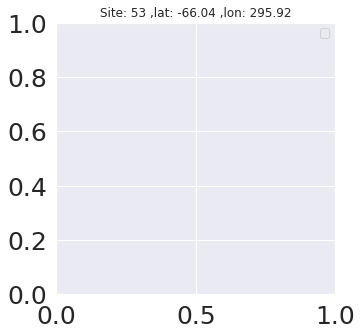

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


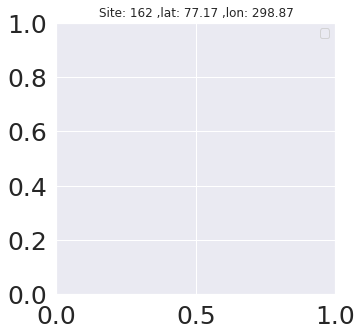

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


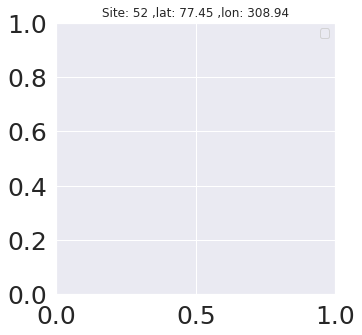

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


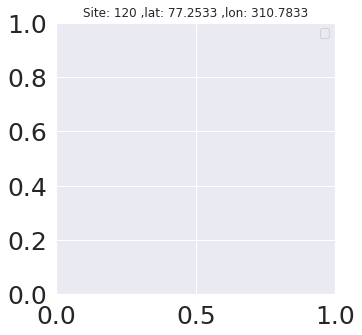

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


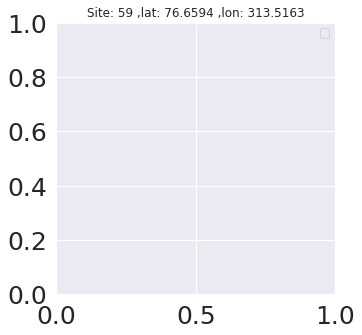

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


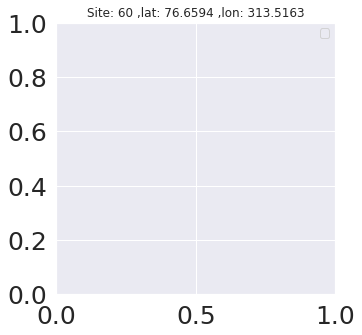

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


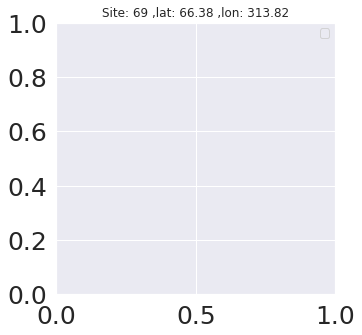

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


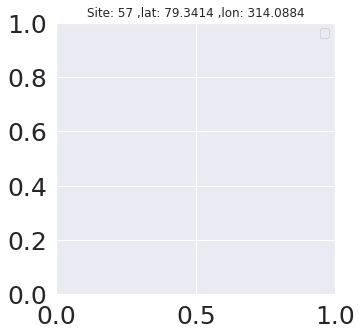

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


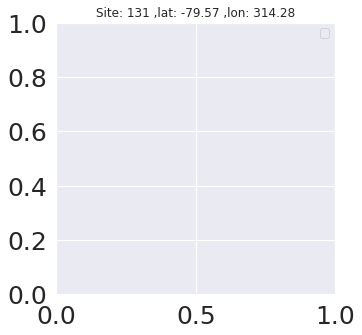

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


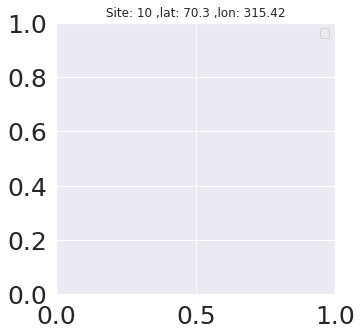

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


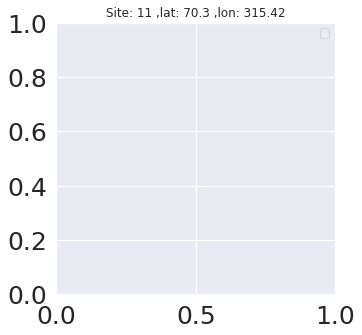

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


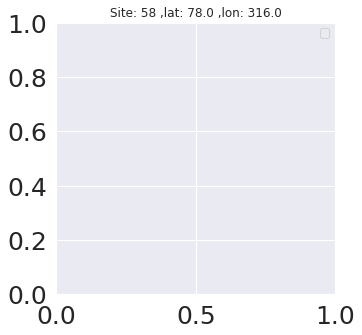

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


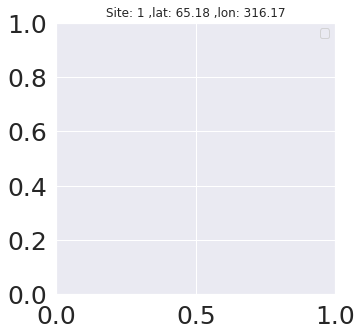

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


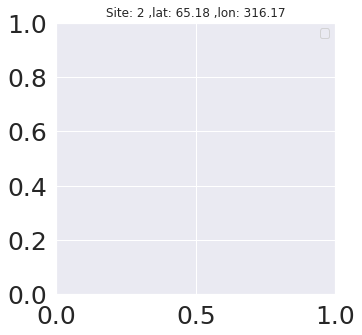

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


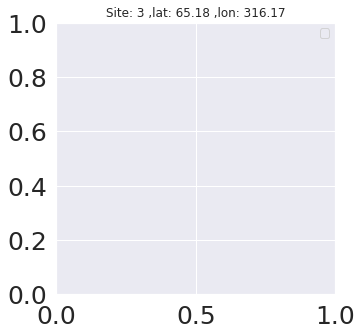

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


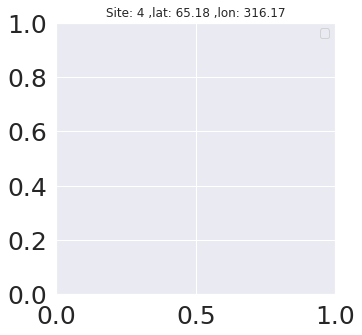

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


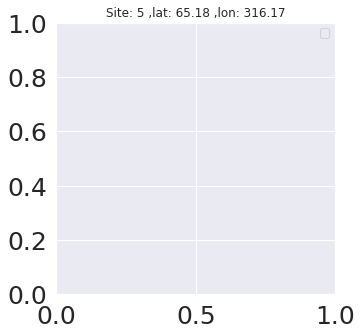

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


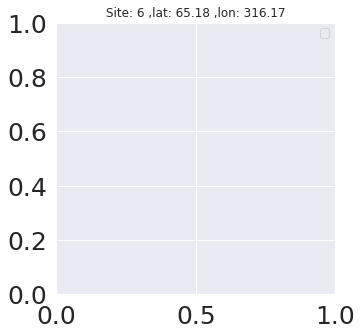

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


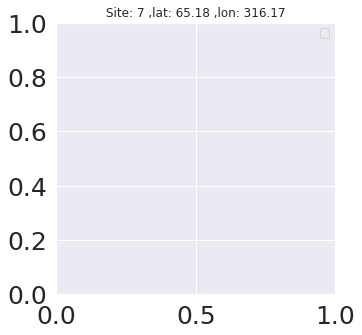

error
error


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


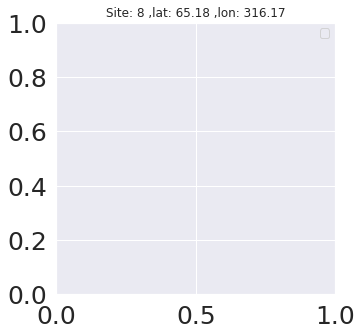

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


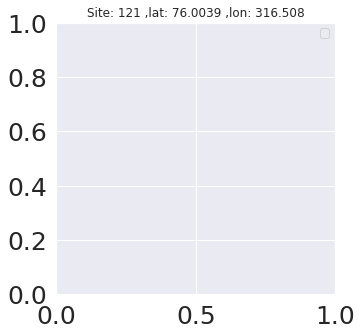

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


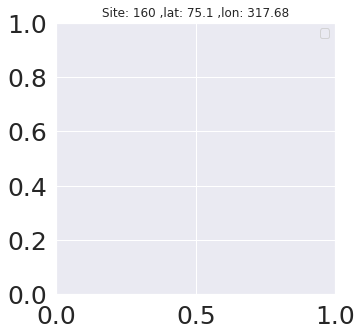

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


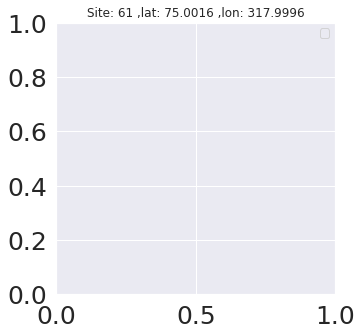

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


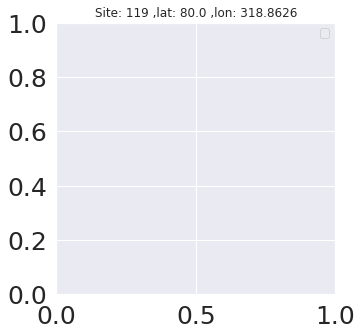

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


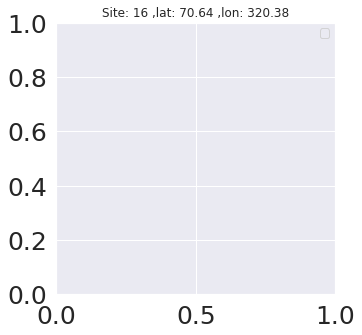

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


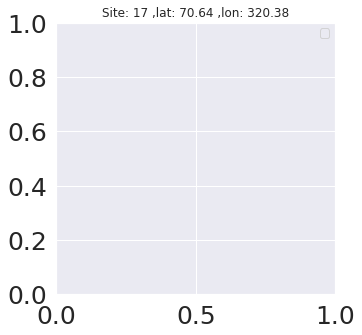

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


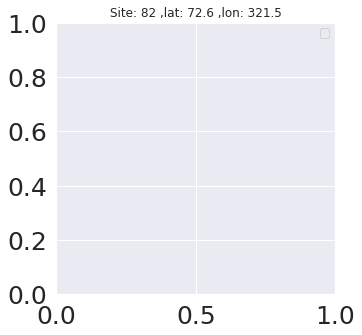

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


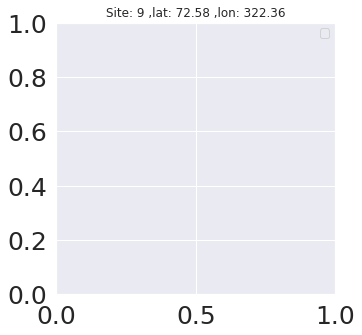

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


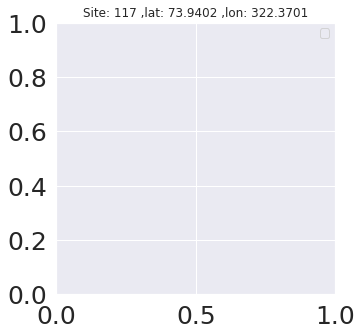

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


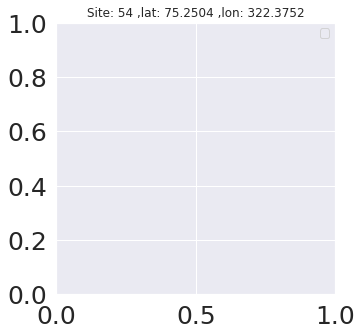

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


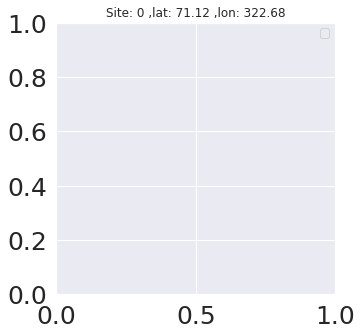

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


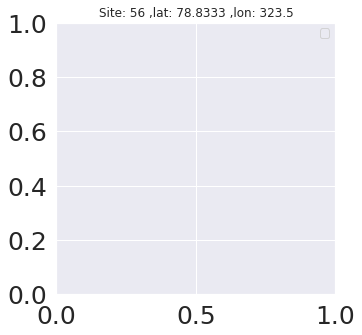

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


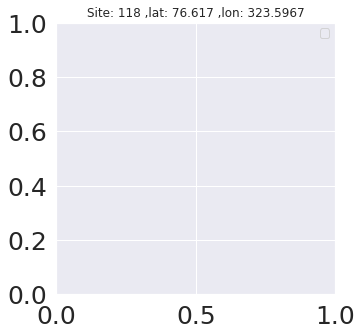

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


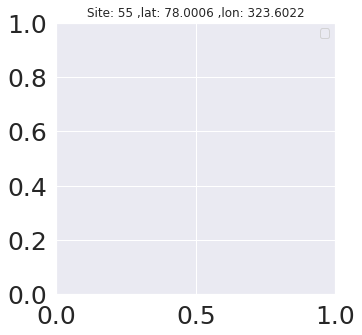

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


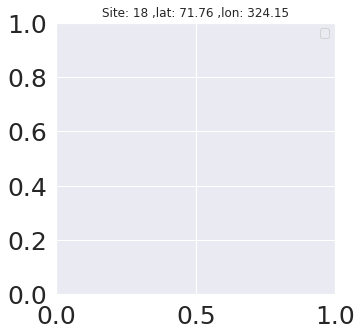

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


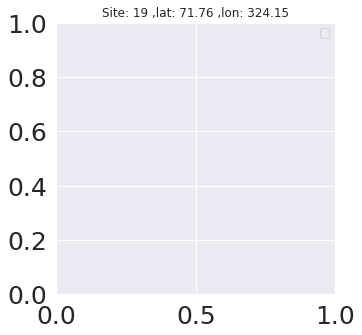

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


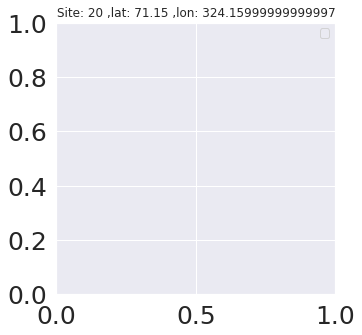

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


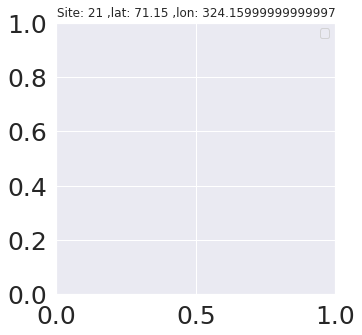

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


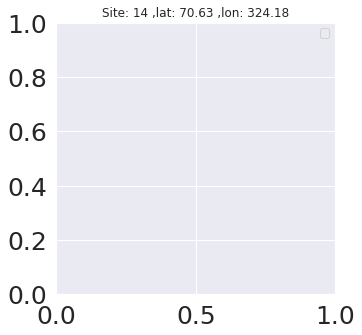

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


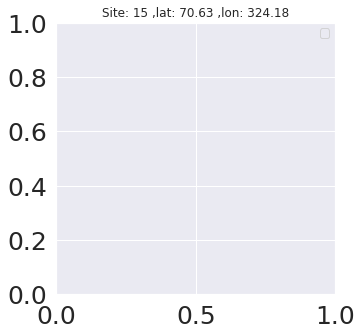

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


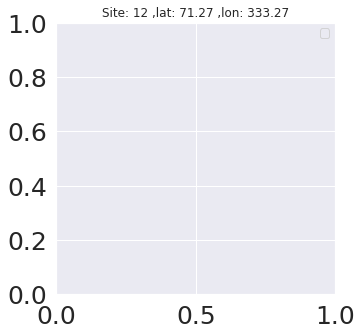

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


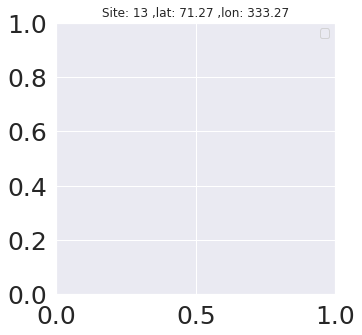

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


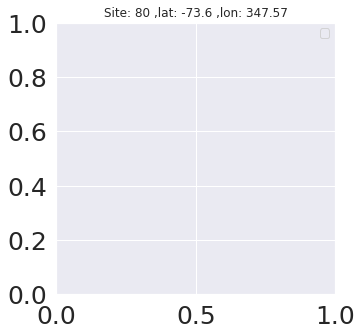

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


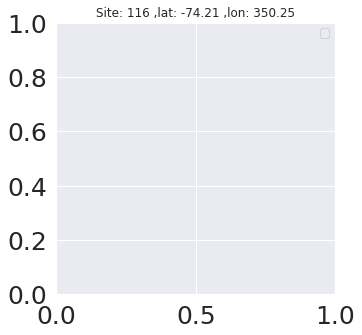

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


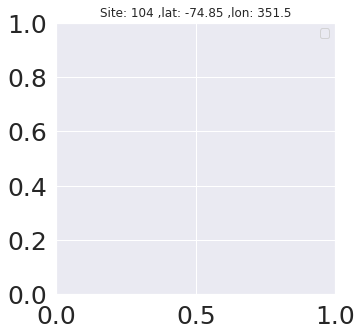

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


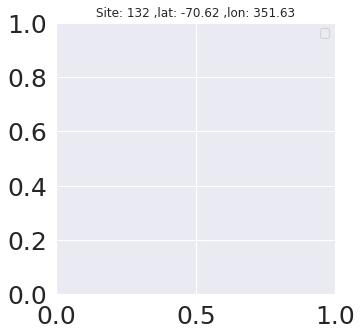

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


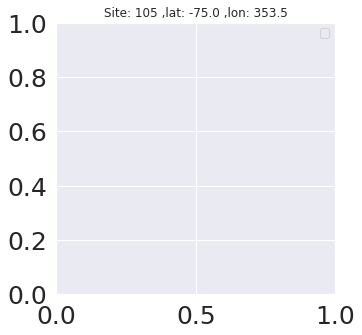

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


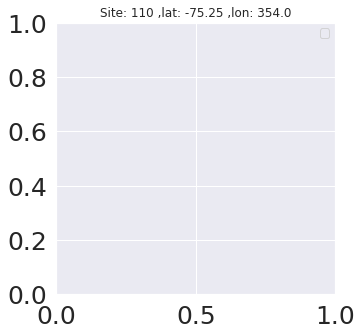

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


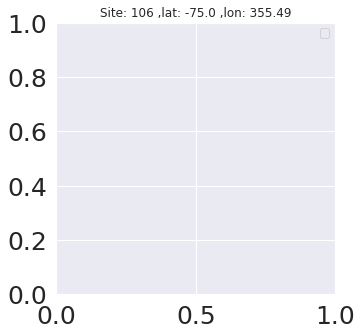

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


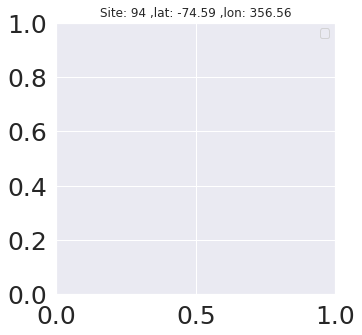

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


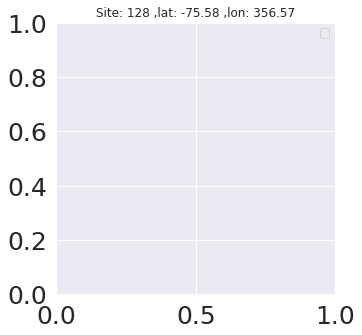

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


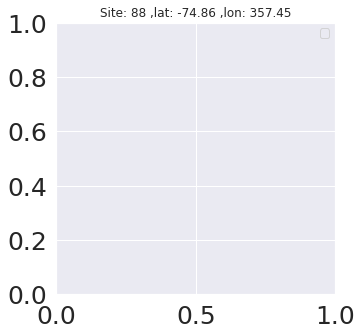

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


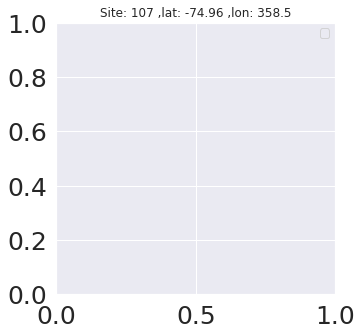

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error
error


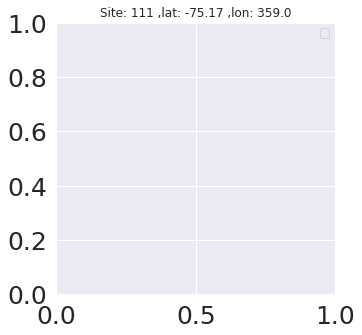

In [61]:
list_prox=[proxies_BE,proxies_cr20]
list_instru=[instrumental_BE,instrumental_cr20]
list_full=[iso2k_BE,iso2k_cr20]
names=['BE','20CR']

"""
BIT UGLY WORKAROUNDS FOR PLOTTING BOTH DATASETS AT ONCE. 

list_prox: proxy values reduced to where there are some
lit_instru: reduced instrumental data (to fit proxy data)
list_full: list of DataArrays containing slopes and intercepts
"""    
all_sites=np.concatenate([db.site.values.tolist() for db in list_full])

#ugly workaround
db1=[0]
db2=[0]
colors=['blue','green']
for ii,s in enumerate(all_sites):
    plt.figure(figsize=(5,5))
    bubul=0
    for i in range(len(list_prox)):
        if i==0:
            index=db1
        else:
            index=db2
        try:
            site=list_full[i].sel(site=s)
            slpe=site['slope'].values.tolist()
            intrcpt=site['intercept'].values.tolist()

            #augment index to find the right proxy/instrumental value
            index[0]+=1

            #import pdb
            #pdb.set_trace()

            x=np.array(list_instru[i][index[0]])
            plt.scatter(x,list_prox[i][index[0]],color=colors[i])
            #print(len()
            string='fitted line for ' + names[i] + ', s: ' +str(np.round(slpe,2)) + ', i:' + str(np.round(intrcpt,2))
            plt.plot(x, intrcpt + slpe*x, colors[i], ls=['-',':'][i],label=string)
            bubul+=1
        except:
            print('error')
            pass
        
    title_string='Site: '+ str(s)+ ' ,lat: '+str(site.lat.values)+' ,lon: '+str(site.lon.values)
    plt.title(title_string)
    plt.legend(fontsize=12)
    plt.show()

In [68]:
new_table=iso2k_BE
records=proxies_BE
instru=instrumental_BE

def regress_plots(new_table,records,instru):
    for i in range(len(new_table.site)):
        plt.figure(figsize=(4,4))
        x=np.array(instru[i])
        slpe=new_table['slope'][i].values.tolist()
        intrcpt=new_table['intercept'][i].values.tolist()
        plt.scatter(x,records[i])
        plt.plot(x, intrcpt + slpe*x, 'r', label='fitted line')
        title_string='s'+str(i)+' slp:'+str(np.round(slpe,2))+', inter:'+str(np.round(intrcpt,2))+', error:'+ str(np.round(new_table['error'][i].values.tolist(),2))
        plt.title(title_string)
        plt.show()

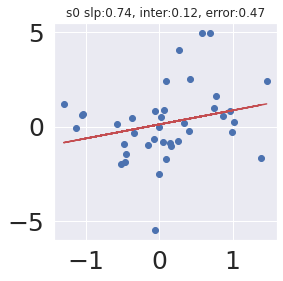

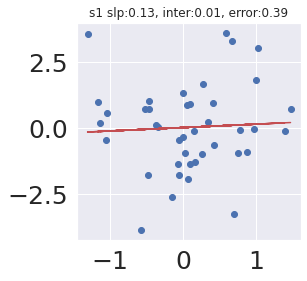

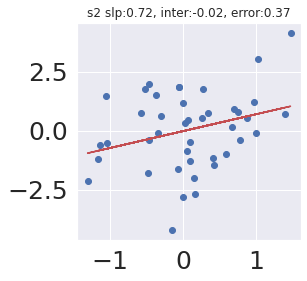

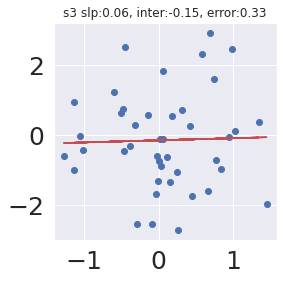

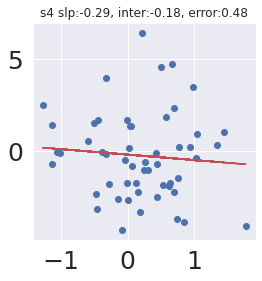

...

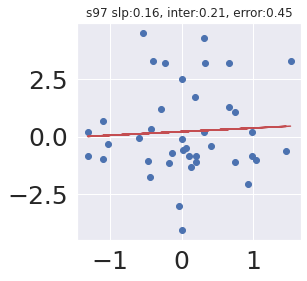

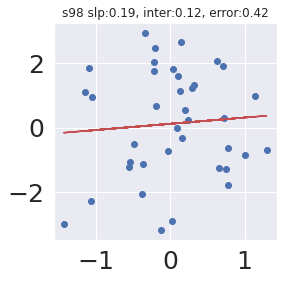

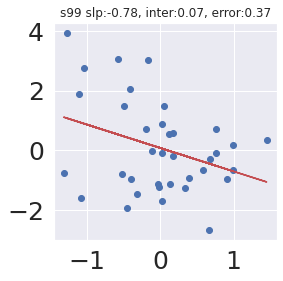

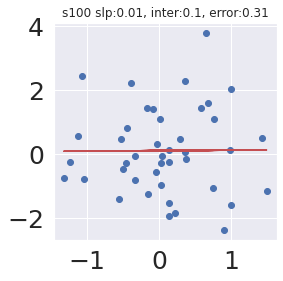

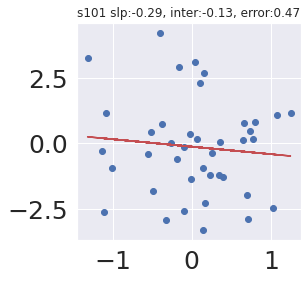

In [69]:
regress_plots(new_table=iso2k_BE,records=proxies_BE,instru=instrumental_BE)

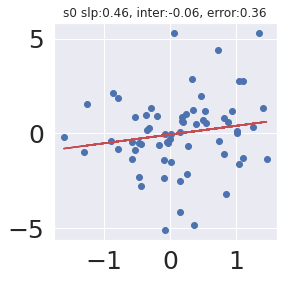

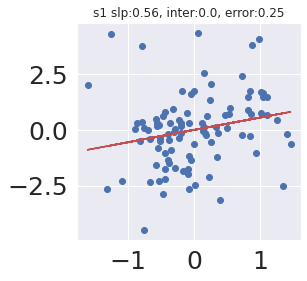

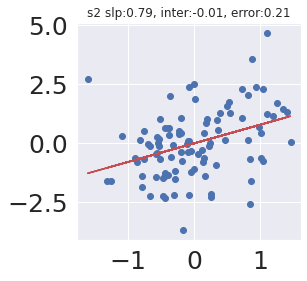

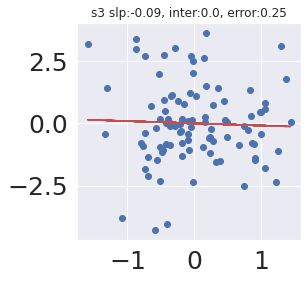

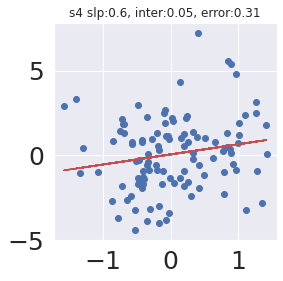

...

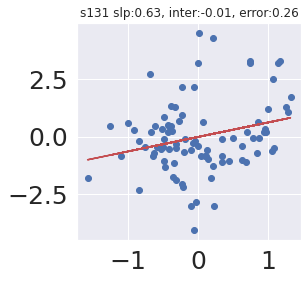

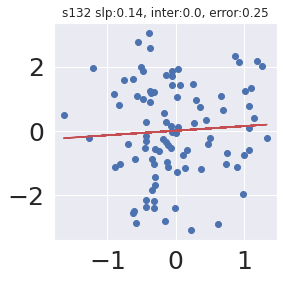

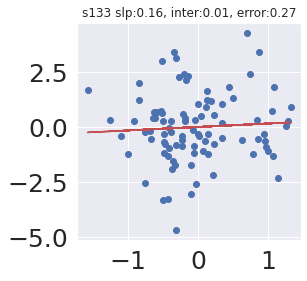

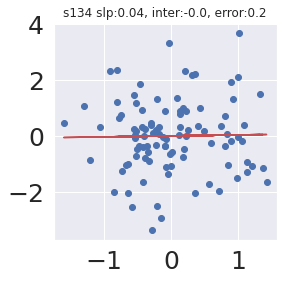

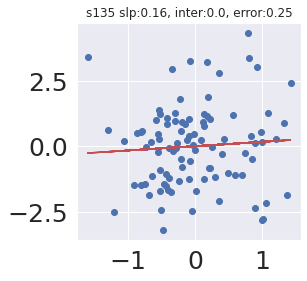

In [70]:
regress_plots(new_table=iso2k_cr20,records=proxies_cr20,instru=instrumental_cr20)

In [101]:
def plot_regress(all_anos,all_records,intercept_a,slope_a,error_a):
    """
    all_anos: temperature anomaly
    all_records: proxy data
    """
    for i in range(len(all_anos)):
        plt.figure(figsize=(4,4))
        #temp anomaly on x-axis
        x=np.array(all_anos[i])
        slpe=slope_a[i]
        intrcpt=intercept_a[i]
        plt.scatter(x,all_records[i])
        plt.plot(x, intrcpt + slpe*x, 'r', label='fitted line')
        title_string='s'+str(i)+' slp:'+str(np.round(slpe,2))+', inter:'+str(np.round(intrcpt,2))+', error:'+ str(np.round(error_a[i],2))
        plt.xlabel('temperature anomaly',fontsize=16)
        plt.ylabel('d18O anomaly',fontsize=16)
        plt.title(title_string)
        plt.show()

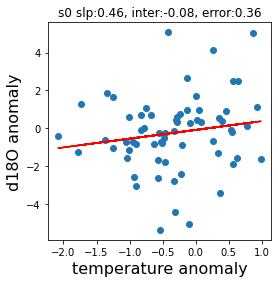

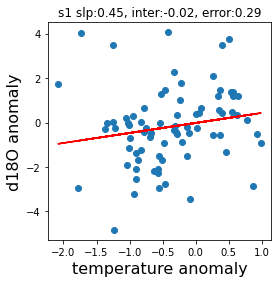

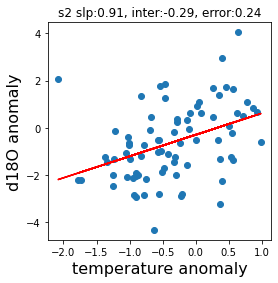

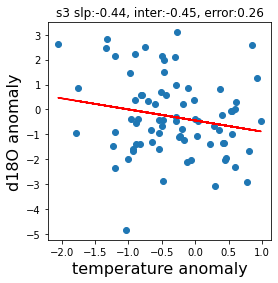

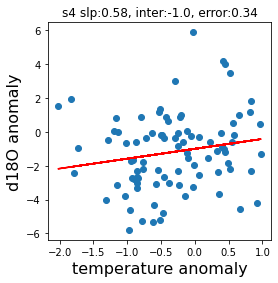

...

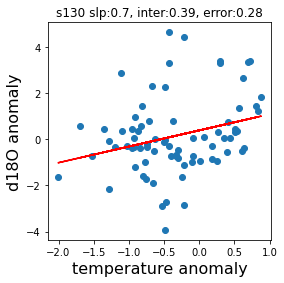

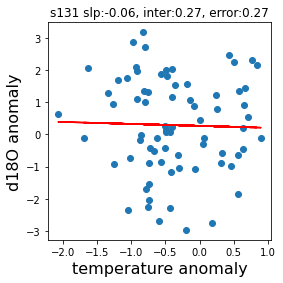

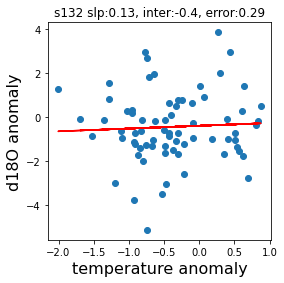

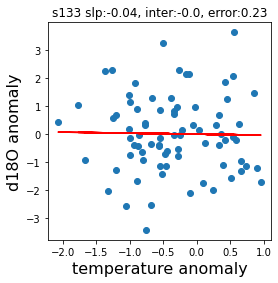

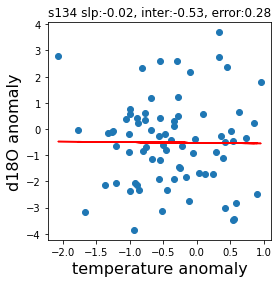

In [102]:
#for the 1920-2000 regression
slp_c20,inter_c20,err_c20,d18,
plot_regress(temp,d18,inter_c20,slp_c20,err_c20)